In [23]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [24]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

In [25]:
from IPython.display import display

In [26]:
import plotly.express as px
from IPython.display import display, HTML

In [27]:
path = os.getcwd()
files = os.listdir(path)

In [28]:
# create the new directory where every exported document will be saved

from datetime import datetime

currentDateTime= datetime.now()
currentDateTime= str(currentDateTime)

fname = 'resumeAnalisis'+' '+currentDateTime[0:4]+\
currentDateTime[5:7]+\
currentDateTime[8:10]+\
currentDateTime[11:13]+\
currentDateTime[14:16]+\
currentDateTime[17:19]+'.csv'
directory = './repro'

if not os.path.exists(directory):
    os.mkdir(directory)
                        
path2 = os.path.join(directory, fname)
#mtcarr.to_csv(str(path2), encoding='UTF-8-sig')

In [29]:
cb1 = [f for f in files if f[-4:] == 'xlsx' and f[:4] == 'KALI']

In [30]:
cb2 = pd.DataFrame()
for f in cb1:
    datos = pd.read_excel(f)
    cb2 = pd.concat([cb2,datos], axis=0)
    
cb2 = cb2.rename(columns = {'CLV_CENTRO':'CCT','CARRERA':'CARR',
                            'GENERACION':'GEN','SEMESTRE':'SEM',
                            'GRUPO':'GPO','NO CONTROL':'NCONT',
                            'NOMBRE':'NOM','PATERNO':'PAT',
                            'MATERNO':'MAT','NOMBRE ASIGNATURA':'ASIG',
                            'NOMBRE DOCENTE':'DOC','RFC DOCENTE':'RFCDOC',
                            'PERIODO 1':'PAR1','PERIODO 2':'PAR2',
                            'PERIODO 3':'PAR3','CALIFICACION':'CALIF',
                            'ASISTENCIA PERIODO 1':'AS1','ASISTENCIA PERIODO 2':'AS2',
                            'ASISTENCIA PERIODO 3':'AS3','TIPO ACRED.':'TACRED'
                           })

In [31]:
cb3 = cb2.iloc[:,1:25]

In [32]:
cb3.columns

Index(['PLANTEL', 'CARR', 'GEN', 'TURNO', 'SEM', 'GPO', 'NCONT', 'NOM', 'PAT',
       'MAT', 'CURP', 'ASIG', 'DOC', 'RFCDOC', 'PAR1', 'PAR2', 'PAR3', 'CALIF',
       'AS1', 'AS2', 'AS3', 'TACRED', 'PERIODO', 'FIRMADO'],
      dtype='object')

In [33]:
cb3['NCONT'] = cb3['NCONT'].apply(str)

In [34]:
del cb3['TACRED']

In [35]:
cb3['SEX']=cb3['CURP'].str[10]

In [36]:
cb3.head(3)

,PLANTEL,CARR,GEN,TURNO,SEM,GPO,NCONT,NOM,PAT,MAT,...,PAR1,PAR2,PAR3,CALIF,AS1,AS2,AS3,PERIODO,FIRMADO,SEX
0,CBTA 205,TÉCNICO AGROPECUARIO,2024 - 2027,matutino,3,3A,24101012050008,ERICK URIEL,RAMIREZ,GONZALEZ,...,9,NaN,NaN,9.0,8.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
1,CBTA 205,TÉCNICO AGROPECUARIO,2024 - 2027,matutino,3,3A,24101012050017,EMILIANO,VENEGAS,CASTILLO,...,7,NaN,NaN,7.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
2,CBTA 205,TÉCNICO AGROPECUARIO,2024 - 2027,matutino,3,3A,24101012050020,DENNIS JAQUELINE,RODRIGUEZ,HERRERA,...,10,NaN,NaN,10.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M


In [37]:
cb3['ASIG'].unique()

array(['Ecosistemas, interacciones, energía y dinámica',
       'Ciencias Naturales Experimentales y Tecnología I. Invitación a la ciencia. Naturaleza de la materia',
       'Conciencia histórica II. México durante el expansionismo capitalista.',
       'Pensamiento Filosófico y Humanidades I. Ejercicio de filosofar y la perspectiva humanista',
       'Lengua y Comunicación I. Leer y escribir para pensarnos juntos',
       'Ciencia, tecnología, sociedad y valores', 'Inglés V',
       'Diseña la red LAN', 'Bases de una lengua extranjera',
       'Inglés I. To be, or not to be, that is the question',
       'Lengua y comunicación III',
       'Diseña productos o servicios para su lanzamiento al mercado',
       'Construyendo mi identidad: colectividad y ciudadanía digital',
       'ESTUDIOS LITERARIOS',
       'Explicación de las estructuras sociales a partir de diferentes tipos de texto',
       'Realiza mantenimiento preventivo',
       'Clasifica los elementos básicos de la red LAN',


In [38]:
cb3.loc[(cb3.CARR == 'COMPONENTE BASICO Y PROPEDEUTICO'), 'CARR'] = 'CBYP'
cb3.loc[(cb3.CARR == 'TÉCNICO AGROPECUARIO') , 'CARR'] = 'TAGP'
cb3.loc[(cb3.CARR == 'TÉCNICO EN EXPLOTACIÓN GANADERA') , 'CARR'] = 'TEGN'
cb3.loc[(cb3.CARR == 'TÉCNICO EN PROGRAMACIÓN') , 'CARR'] = 'TPGM'
cb3.loc[(cb3.CARR == 'TéCNICO EN ADMINISTRACIóN DE EMPRENDIMIENTOS') , 'CARR'] = 'TAEM'
cb3.loc[(cb3.CARR == 'TÉCNICO EN ADMINISTRACIÓN PARA EL EMPRENDIMIENTO AGROPECUARIO') , 'CARR'] = 'TAEA'
cb3.loc[(cb3.CARR == 'TÉCNICO EN OFIMÁTICA') , 'CARR'] = 'TOFI'
cb3.loc[(cb3.CARR == 'TÉCNICO EN VITICULTURA') , 'CARR'] = 'TVIT'
cb3.loc[(cb3.CARR == 'TÉCNICO EN ADMINISTRACIÓN EN MIPYMES') , 'CARR'] = 'TMPY'
cb3.loc[(cb3.CARR == 'TÉCNICO EN SOPORTE Y MANTENIMIENTO DE EQUIPO DE CÓMPUTO') , 'CARR'] = 'TSMEC'
cb3.loc[(cb3.CARR == 'TÉCNICO EN RECURSOS HÍDRICOS') , 'CARR'] = 'T_RHI'
cb3.loc[(cb3.CARR == 'TÉCNICO EN LOGÍSTICA') , 'CARR'] = 'T_LGI'
cb3.loc[(cb3.CARR == 'TÉCNICO EN ADMINISTRACIÓN DE RECURSOS HUMANOS') , 'CARR'] = 'T_ARH'
cb3.loc[(cb3.CARR == 'TÉCNICO EN ACUACULTURA') , 'CARR'] = 'T_ACU'

In [39]:
cb3.loc[(cb3.CARR == 'COMPONENTE BASICO Y PROPEDEUTICO'), 'CARR'] = 'CBYP'
cb3.loc[(cb3.CARR == 'TÉCNICO AGROPECUARIO') , 'CARR'] = 'TAGP'
cb3.loc[(cb3.CARR == 'TÉCNICO EN EXPLOTACIÓN GANADERA') , 'CARR'] = 'TEGN'
cb3.loc[(cb3.CARR == 'TÉCNICO EN PROGRAMACIÓN') , 'CARR'] = 'TPGM'
cb3.loc[(cb3.CARR == 'TéCNICO EN ADMINISTRACIóN DE EMPRENDIMIENTOS') , 'CARR'] = 'TAEM'
cb3.loc[(cb3.CARR == 'TÉCNICO EN ADMINISTRACIÓN PARA EL EMPRENDIMIENTO AGROPECUARIO') , 'CARR'] = 'TAEA'
cb3.loc[(cb3.CARR == 'TÉCNICO EN OFIMÁTICA') , 'CARR'] = 'TOFI'
cb3.loc[(cb3.CARR == 'TÉCNICO EN VITICULTURA') , 'CARR'] = 'TVIT'
cb3.loc[(cb3.CARR == 'TÉCNICO EN ADMINISTRACIÓN EN MIPYMES') , 'CARR'] = 'TMPY'
cb3.loc[(cb3.CARR == 'TÉCNICO EN SOPORTE Y MANTENIMIENTO DE EQUIPO DE CÓMPUTO') , 'CARR'] = 'TSMEC'
cb3.loc[(cb3.CARR == 'TÉCNICO EN RECURSOS HÍDRICOS') , 'CARR'] = 'T_RHI'
cb3.loc[(cb3.CARR == 'TÉCNICO EN LOGÍSTICA') , 'CARR'] = 'T_LGI'
cb3.loc[(cb3.CARR == 'TÉCNICO EN ADMINISTRACIÓN DE RECURSOS HUMANOS') , 'CARR'] = 'T_ARH'
cb3.loc[(cb3.CARR == 'TÉCNICO EN ACUACULTURA') , 'CARR'] = 'T_ACU'

In [40]:
cb3.loc[cb3["ASIG"] == "TECNOLOGÍAS DE LA INFORMACIÓN Y LA COMUNICACIÓN", "ASIG"] = 'TIC'
cb3.loc[cb3["ASIG"] == "LECTURA, EXPRESIÓN ORAL Y ESCRITA I", "ASIG"] = 'LEOYE'

cb3.loc[cb3["ASIG"] == "TEMAS DE CIENCIAS DE LA SALUD", "ASIG"] = 'TCSD'
cb3.loc[cb3["ASIG"] == "Reacciones químicas, conservación de la materia en la formación de nuevas substancias.", "ASIG"] = 'RQCMFNS'
cb3.loc[cb3["ASIG"] == "Formación socioemocional IV", "ASIG"] = 'FSE IV'
cb3.loc[cb3["ASIG"] == "INTRODUCCIÓN AL DERECHO", "ASIG"] = 'INDRCHO'
cb3.loc[cb3["ASIG"] == "Conciencia histórica I. Perspectivas del México antiguo en los contextos globales", "ASIG"] = 'CNHIST_1'
cb3.loc[cb3["ASIG"] == "APOYA EN LA REALIZACIÓN DE TRÁMITES JURÍDICO-ADMINISTRATIVOS", "ASIG"] = 'APRTRJADM'
cb3.loc[cb3["ASIG"] == "Lengua y comunicación II", "ASIG"] = 'LyC II'
cb3.loc[cb3["ASIG"] == "Opera una red LAN", "ASIG"] = 'ORLAN'
cb3.loc[cb3["ASIG"] == "Ensambla e instala controladores y dispositivos periféricos", "ASIG"] = 'ENINCDPP'
cb3.loc[cb3["ASIG"] == "PARTICIPA EN LA ESTRUCTURACIÓN DEL PLAN DE NEGOCIO", "ASIG"] = 'PEPLANNEG'
cb3.loc[cb3["ASIG"] == "Colabora en la planificación, organización, dirección y control de la unidad económica", "ASIG"] = 'CPODCUNIDE'
cb3.loc[cb3["ASIG"] == "Instala una red LAN", "ASIG"] = 'IRLAN'
cb3.loc[cb3["ASIG"] == "Cálculo diferencial", "ASIG"] = 'CALCDF'
cb3.loc[cb3["ASIG"] == "PROBABILIDAD Y ESTADÍSTICA", "ASIG"] = 'PROyEST'
cb3.loc[cb3["ASIG"] == "Produce cultivos agrícolas a cielo abierto", "ASIG"] = 'PCTVCLA'
cb3.loc[cb3["ASIG"] == "Formación socioemocional II", "ASIG"] = 'FSE II'
cb3.loc[cb3["ASIG"] == "Procesa productos cárnicos", "ASIG"] = 'PPRODCARN'
cb3.loc[cb3["ASIG"] == "MATEMÁTICAS APLICADAS", "ASIG"] = 'MATAPL'
cb3.loc[cb3["ASIG"] == "Temas selectos de matemáticas I", "ASIG"] = 'SELECTMAT_I'
cb3.loc[cb3["ASIG"] == "TEMAS DE BIOLOGÍA CONTEMPORÁNEA", "ASIG"] = 'TBIOLCONT'
cb3.loc[cb3["ASIG"] == "Opera proyecto productivo agropecuario", "ASIG"] = 'OPPROYAGR'
cb3.loc[cb3["ASIG"] == "Maneja aves y otras especies alternas", "ASIG"] = 'MAVES'
cb3.loc[cb3["ASIG"] == "Maneja especies monogástricas", "ASIG"] = 'MONOGAS'
cb3.loc[cb3["ASIG"] == "Maneja especies poligástricas", "ASIG"] = 'POLIGAS'
cb3.loc[cb3["ASIG"] == "INTRODUCCIÓN A LA ECONOMÍA", "ASIG"] = 'INTECON'
cb3.loc[cb3["ASIG"] == "Registra operaciones contables de la unidad económica", "ASIG"] = 'RGCONTUECO'
cb3.loc[cb3["ASIG"] == "Cultura digital II", "ASIG"] = 'CDIGIT_II'
cb3.loc[cb3["ASIG"] == "Brinda soporte técnico a distancia", "ASIG"] = 'SOTECDIST'
cb3.loc[cb3["ASIG"] == "PARTICIPA EN LA ELABORACIÓN Y PRESENTACIÓN DEL PLAN DE MERCADOTECNIA PARA EL LANZAMIENTO UN PRODUCTO O SERVICIO", "ASIG"] = 'PMERCALNZ'
cb3.loc[cb3["ASIG"] == "Instala y configura software", "ASIG"] = 'INSTSOFT'
cb3.loc[cb3["ASIG"] == "Ciencias sociales II", "ASIG"] = 'CS_II'
cb3.loc[cb3["ASIG"] == "Ciencias sociales III", "ASIG"] = 'CS_III'
cb3.loc[cb3["ASIG"] == "APOYA EN LA IDENTIFICACIÓN DE LA MERCADOTECNIA DE UN PLAN DE NEGOCIOS", "ASIG"] = 'AMERCANEG'
cb3.loc[cb3["ASIG"] == "Elabora perfil de proyectos agropecuarios", "ASIG"] = 'EPRFPRYAGR'
cb3.loc[cb3["ASIG"] == "Brinda soporte técnico de manera presencial", "ASIG"] = 'BRSPRTPRSNC'
cb3.loc[cb3["ASIG"] == "Produce insumos orgánicos para la agricultura", "ASIG"] = 'PRIMORGAG'
cb3.loc[cb3["ASIG"] == "Procesa productos hortofrutícolas", "ASIG"] = 'PHORTOFRU'
cb3.loc[cb3["ASIG"] == "La conservación de la energía y su interacción con la materia", "ASIG"] = 'CNSENRGINTMT'
cb3.loc[cb3["ASIG"] == "Produce cultivos en agricultura protegida", "ASIG"] = 'CLTVPRTG'
cb3.loc[cb3["ASIG"] == "Procesa productos lácteos", "ASIG"] = 'PRLACTEO'
cb3.loc[cb3["ASIG"] == "PARTICIPA EN LA ELABORACIÓN DEL ESTUDIO DE MERCADO", "ASIG"] = 'PESTMERCA'
cb3.loc[cb3["ASIG"] == "TEMAS DE FÍSICA", "ASIG"] = 'TEMFIS'

cb3.loc[cb3["ASIG"] == "TEMAS DE FILOSOFÍA", "ASIG"] = 'TEMFIL'
cb3.loc[cb3["ASIG"] == "TEMAS DE CIENCIAS SOCIALES", "ASIG"] = 'TEMCS'
cb3.loc[cb3["ASIG"] == "Pensamiento matemático II", "ASIG"] = 'PM_II'
cb3.loc[cb3["ASIG"] == "Pensamiento matemático I", "ASIG"] = 'PM_I'
cb3.loc[cb3["ASIG"] == "PARTICIPA EN EL PROCESO DE LANZAMIENTO DE UN PRODUCTO O SERVICIO", "ASIG"] = 'LANZPRODSERV'
cb3.loc[cb3["ASIG"] == "Opera proyectos de desarrollo sustentable", "ASIG"] = 'OPRYDESSUST'
cb3.loc[cb3["ASIG"] == "Instala y opera redes de computadoras", "ASIG"] = 'IREDCOMP'
cb3.loc[cb3["ASIG"] == "Maneja especies pecuarias", "ASIG"] = 'ESPPECUAR'
cb3.loc[cb3["ASIG"] == "Produce cultivos para la alimentación y la industria", "ASIG"] = 'PCALTNDUST'
cb3.loc[cb3["ASIG"] == "Procesa productos agropecuarios", "ASIG"] = 'PROCESAGRO'

cb3.loc[cb3["ASIG"] == "PARTICIPA EN LA ELABORACIÓN DEL PLAN DE NEGOCIO", "ASIG"] = 'ELABNEGO'
cb3.loc[cb3["ASIG"] == "Ensambla, configura e instala hardware y software en el equipo de cómputo", "ASIG"] = 'ENHARDSOFT'
cb3.loc[cb3["ASIG"] == "Proporciona soporte técnico presencial o a distancia en software de aplicación y hardware", "ASIG"] = 'SPTECSOFTHARD'
cb3.loc[cb3["ASIG"] == "GESTIONA PROCESOS ADMINISTRATIVOS Y CONTABLES BÁSICOS DE LA UNIDAD ECONÓMICA", "ASIG"] = 'GESTADMCONTAUE'

cb3.loc[cb3["ASIG"] == "Lengua y Comunicación I. Leer y escribir para pensarnos juntos", "ASIG"] = 'LCM1'
cb3.loc[cb3["ASIG"] == "Inglés I. To be, or not to be, that is the question", "ASIG"] = 'ING1'
cb3.loc[cb3["ASIG"] == "Pensamiento Matemático I. Pensamiento aritmético", "ASIG"] = 'PMT1'
cb3.loc[cb3["ASIG"] == "Ciencias Sociales I. Estado ciudadania y relaciones de poder", "ASIG"] = 'CSOC1'
cb3.loc[cb3["ASIG"] == "Cultura Digital I. Ciudadania digital", "ASIG"] = 'CDIG1'
cb3.loc[cb3["ASIG"] == "La energía en los procesos de la vida diaria", "ASIG"] = 'EPVD'
cb3.loc[cb3["ASIG"] == "Pensamiento Filosófico y Humanidades I. Ejercicio de filosofar y la perspectiva humanista", "ASIG"] = 'PFyH1'
cb3.loc[cb3["ASIG"] == "Ciencias Naturales Experimentales y Tecnología I. Invitación a la ciencia. Naturaleza de la materia", "ASIG"] = 'CNAT1'


In [41]:
data = [
    ['TIC','Tecnologías de la Información y la Comunicación'],
    ['LEOYE','Lectura, Expresión Oral y Escrita I',],
    ['TCSD','Temas de Ciencia y de la Salud'],
    ['RQCMFNS','Reacciones Químicas, Conservación de la Materia en la Formación de Nuevas Substancias'],
    ['FSE IV','Formación Socioemocional IV'],
    ['INDRCHO','Introducción al Derecho'],
    ['CNHIST I','Conciencia Histórica I'],
    ['APRTRJADM','Apoya en la Realización de Trámites Jurídico-Administrativos'],
    ['LyC II','Lengua y Comunicación II'],
    ['ORLAN','Opera una Red LAN'],
    ['ENINCDPP','Ensambla e Instala Controladores y Dispositivos Periféricos'],
    ['PEPLANNEG','Participa en la Estructuración del Plan de Negocio'],
    ['CPODCUNIDE','Colabora en la Planificación, Organización, Dirección y Control de la Unidad Económica'],
    ['IRLAN','Instala una Red LAN'],
    ['CALCDF','Cálculo Diferencial'],
    ['PROyEST','Probabilidad y Estadística'],
    ['PCTVCLA','Produce Cultivos Agrícolas a Cielo Abierto'],
    ['FSE II','Formación Socioemocional II'],
    ['PPRODCARN','Procesa Productos Cárnicos'],
    ['PPRODCARN','Procesa Productos Cárnicos'],
    ['MATAPL','Matemáticas Aplicadas'],
    ['SELECTMAT I','Temas Selectos de Matemáticas I'],
    ['TBIOLCONT','Temas de Biología Contemporánea'],
    ['OPPROYAGR','Opera Proyecto Productivo Agropecuario'],
    ['MAVES','Maneja Aves y Otras Especies Alternas'],
    ['MONOGAS','Maneja Especies Monogástricas'],
    ['POLIGAS','Maneja Especies Poligástricas'],
    ['INTECON','Introducción a la Economía'],
    ['RGCONTUECO','Registra Operaciones Contables de la Unidad Económica'],
    ['CDIGIT_II','Cultura Digital II'],
    ['PMERCALNZ','Participa en la Elaboración y Presentación del Plan de Mercadotécnia para el Lanzamiento de Producto o Servicio'],
    ['INSTSOFT','Instala y Configura Software'],
    ['CS II','Ciencias Sociales II'],
    ['CS III','Ciencias Sociales III'],
    ['AMERCANEG','Apoya en la Identificación de la Mercadotécnia en un Plan de Negocios'],
    ['SOTECDIST','Brinda soporte técnico a distancia'],
    ['EPRFPRYAGR','Elabora Perfil de Proyectos Agropecuarios'],
    ['BRSPRTPRSNC','Brinda Soporte Técnico de Manera Presencial'],
    ['PRIMORGAG','Produce Insumos Orgánicos para la Agricultura'],
    ['PHORTOFRU','Procesa Productos Hortofrutícolas'],
    ['CNSENRGINTMT','La Conservación de la Energía y su Interacción con la Materia'],
    ['CLTVPRTG','Produce Cultivos en Agricultura Protegida'],
    ['PRLACTEO','Procesa Productos Lácteos'],
    ['PESTMERCA','Participa en la Elaboración del Estudio de Mercado'],
    ['TEMFIS','Temas de Física'],
    ['TEMFIL','Temas de Filosofía'],
    ['TEMCS','Temas de Ciencias Sociales'],
    ['PM II','Pensamiento Matemático II'],
    ['PM I','Pensamiento Matemático I'],
    ['LANZPRODSERV','Participa en el Proceso de Lanzamiento de un Producto o Servicio'],
    ['OPRYDESSUST','Opera Proyectos de Desarrollo Sustentable'],
    ['IREDCOMP','Instala y Opera Redes de Computadoras'],
    ['ESPPECUAR','Maneja Especies Pecuarias'],
    ['PCALTNDUST','Produce Cultivos para la Alimentación y la Industria'],
    ['PROCESAGRO','Procesa Productos Agropecuarios'],
    ['ELABNEGO','Participa en la Elaboración del Plan de Negocio'],
    ['ENHARDSOFT','Ensambla, Configura e Instala Hardware y Software en el Equipo de Cómputo'],
    ['SPTECSOFTHARD','Proporciona Soporte Técnico Presencial o a Distancia en Software de Aplicación y Hardware'],
    ['GESTADMCONTAUE','Gestiona Procesos Administrativos y COntables Básicos de la Unidad Económica'],

    ['LCM1','Lengua y Comunicación I. Leer y escribir para pensarnos juntos'],
    ['ING1','Inglés I. To be, or not to be, that is the question'],
    ['CSOC1','Ciencias Sociales I. Estado ciudadania y relaciones de poder'],
    ['PMT1','Pensamiento Matemático I. Pensamiento aritmético'],
    ['CDIG1','Cultura Digital I. Ciudadania digital'],
    ['EPVD','La energía en los procesos de la vida diaria'],
    ['PFyH1','Pensamiento Filosófico y Humanidades I. Ejercicio de filosofar y la perspectiva humanista'],
    ['CNAT1','Ciencias Naturales Experimentales y Tecnología I. Invitación a la ciencia. Naturaleza de la materia']
   


    

       ]


In [42]:
df = pd.DataFrame(data, columns=['CODE', 'Unidad de Aprendizaje'])
df = df.reset_index()
df = df.sort_values('CODE')
df = df.reset_index()
df =  df.iloc[:,[2,3]]
glosario = df
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):  # more options can be specified also
    display(glosario)

,CODE,Unidad de Aprendizaje
0,AMERCANEG,Apoya en la Identificación de la Mercadotécnia en un Plan de Negocios
1,APRTRJADM,Apoya en la Realización de Trámites Jurídico-Administrativos
2,BRSPRTPRSNC,Brinda Soporte Técnico de Manera Presencial
3,CALCDF,Cálculo Diferencial
4,CDIG1,Cultura Digital I. Ciudadania digital
5,CDIGIT_II,Cultura Digital II
6,CLTVPRTG,Produce Cultivos en Agricultura Protegida
7,CNAT1,Ciencias Naturales Experimentales y Tecnología I. Invitación a la ciencia. Naturaleza de la materia
8,CNHIST I,Conciencia Histórica I
9,CNSENRGINTMT,La Conservación de la Energía y su Interacción con la Materia


In [43]:
cb3.iloc[1038,1:11]

CARR                   CBYP
GEN             2024 - 2027
TURNO              matutino
SEM                       1
GPO                      1C
NCONT        24101012050038
NOM                    SAUL
PAT                  MACIAS
MAT                   PEREZ
CURP     MAPS090407HASCRLA4
Name: 1038, dtype: object

In [44]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):  # more options can be specified also
    display(cb3[cb3['CALIF'].isnull()])

,PLANTEL,CARR,GEN,TURNO,SEM,GPO,NCONT,NOM,PAT,MAT,CURP,ASIG,DOC,RFCDOC,PAR1,PAR2,PAR3,CALIF,AS1,AS2,AS3,PERIODO,FIRMADO,SEX
433,CBTA 205,TAGP,2018 - 2020,matutino,1,1A,181011205A0034,JAZMIN ESTRELLA,GARCIA,LOPEZ,GALJ981123MASRPZ09,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
434,CBTA 205,TAGP,2021 - 2024,matutino,1,1A,21101012050090,RAMON,ZAMARRIPA,CONTRERAS,ZACR040819HASMNMA1,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
435,CBTA 205,TAGP,2022 - 2025,matutino,1,1A,22101012050056,DEISY DE JESUS,TOMAS,BORRAYO,TOBD071121MASMRSA2,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
436,CBTA 205,TAGP,2023 - 2026,matutino,1,1A,23101012050122,MIRANDA VICTORIA,MONTOYA,VILLA,MOVM051124MASNLRA0,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
437,CBTA 205,TAGP,2025 - 2028,matutino,1,1A,251011205A0001,EDITH,CONTRERAS,REYES,CORE830903MASNYD00,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
438,CBTA 205,TAGP,2025 - 2028,matutino,1,1A,251011205A0002,CAROLINA,CONTRERAS,REYES,CORC870328MASNYR04,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
439,CBTA 205,TAGP,2025 - 2028,matutino,1,1A,251011205A0003,KENIA HAEL,DUEÑAS,ARELLANO,DUAK951116MASXRN00,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
440,CBTA 205,TAGP,2025 - 2028,matutino,1,1A,251011205A0004,EFRAIN,VELAZQUEZ,LOPEZ,VELE070124HZSLPFA6,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
441,CBTA 205,TAGP,2025 - 2028,matutino,1,1A,251011205A0005,ROSA ESPERANZA,ZAMORA,MARTINEZ,ZAMR840520MASMRS02,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
442,CBTA 205,TAGP,2025 - 2028,matutino,1,1A,251011205A0006,CINTHIA,DURON,DIAZ,DUDC871028MASRZN01,Bases de una lengua extranjera,ANA LUCIA GONZALEZ GALLEGOS,GOGA8504235S8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M


In [45]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):  # more options can be specified also
    display(cb3)

,PLANTEL,CARR,GEN,TURNO,SEM,GPO,NCONT,NOM,PAT,MAT,CURP,ASIG,DOC,RFCDOC,PAR1,PAR2,PAR3,CALIF,AS1,AS2,AS3,PERIODO,FIRMADO,SEX
0,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050008,ERICK URIEL,RAMIREZ,GONZALEZ,RAGE090315HASMNRA9,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9.0,8.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
1,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050017,EMILIANO,VENEGAS,CASTILLO,VECE090712HASNSMA5,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,7,NaN,NaN,7.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
2,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050020,DENNIS JAQUELINE,RODRIGUEZ,HERRERA,ROHD090712MASDRNA6,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,10,NaN,NaN,10.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
3,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050028,KATHERINE MICHEL,LUEVANO,SERRANO,LUSK080710MASVRTA8,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9.0,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
4,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050030,MELANY FERNANDA,GUERRERO,SUAREZ,GUSM090104MASRRLA2,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,10,NaN,NaN,10.0,11.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
5,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050032,XIMENA,MUÑOZ,MOTA,MUMX091112MASXTMA1,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,8,NaN,NaN,8.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
6,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050033,ROSA ELENA,CASTORENA,SEGURA,CASR090614MASSGSA5,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9.0,11.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
7,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050046,INDRA GUADALUPE,CASTAÑEDA,PAZ,CAPI091204MASSZNA3,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,5,NaN,NaN,5.0,11.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
8,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050049,TANIA GUADALUPE,GONZALEZ,ESPARZA,GOET071227MASNSNA5,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,10,NaN,NaN,10.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
9,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050050,VERONICA XIMENA,MONTIEL,VARGAS,MOVV090917MASNRRA7,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M


In [46]:
cb3 = cb3[cb3['CALIF'].notna()]

In [47]:
cb3.columns

Index(['PLANTEL', 'CARR', 'GEN', 'TURNO', 'SEM', 'GPO', 'NCONT', 'NOM', 'PAT',
       'MAT', 'CURP', 'ASIG', 'DOC', 'RFCDOC', 'PAR1', 'PAR2', 'PAR3', 'CALIF',
       'AS1', 'AS2', 'AS3', 'PERIODO', 'FIRMADO', 'SEX'],
      dtype='object')

In [48]:
prefix = 'FSE'

In [49]:
cb3 = cb3[~cb3['ASIG'].str.startswith(prefix)]

In [50]:
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):  # more options can be specified also
    display(cb3)

,PLANTEL,CARR,GEN,TURNO,SEM,GPO,NCONT,NOM,PAT,MAT,CURP,ASIG,DOC,RFCDOC,PAR1,PAR2,PAR3,CALIF,AS1,AS2,AS3,PERIODO,FIRMADO,SEX
0,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050008,ERICK URIEL,RAMIREZ,GONZALEZ,RAGE090315HASMNRA9,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9.0,8.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
1,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050017,EMILIANO,VENEGAS,CASTILLO,VECE090712HASNSMA5,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,7,NaN,NaN,7.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
2,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050020,DENNIS JAQUELINE,RODRIGUEZ,HERRERA,ROHD090712MASDRNA6,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,10,NaN,NaN,10.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
3,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050028,KATHERINE MICHEL,LUEVANO,SERRANO,LUSK080710MASVRTA8,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9.0,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
4,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050030,MELANY FERNANDA,GUERRERO,SUAREZ,GUSM090104MASRRLA2,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,10,NaN,NaN,10.0,11.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
5,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050032,XIMENA,MUÑOZ,MOTA,MUMX091112MASXTMA1,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,8,NaN,NaN,8.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
6,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050033,ROSA ELENA,CASTORENA,SEGURA,CASR090614MASSGSA5,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9.0,11.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
7,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050046,INDRA GUADALUPE,CASTAÑEDA,PAZ,CAPI091204MASSZNA3,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,5,NaN,NaN,5.0,11.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
8,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050049,TANIA GUADALUPE,GONZALEZ,ESPARZA,GOET071227MASNSNA5,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,10,NaN,NaN,10.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
9,CBTA 205,TAGP,2024 - 2027,matutino,3,3A,24101012050050,VERONICA XIMENA,MONTIEL,VARGAS,MOVV090917MASNRRA7,"Ecosistemas, interacciones, energía y dinámica",AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9.0,10.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M


In [51]:
#cb3 = cb3.fillna('.')
#cb3['PAR1'] = cb3['PAR1'].apply(lambda x: int(x) if x.isdigit() else 0)

#cb3.loc[cb3.PAR1 == 'AC', 'PAR1'] = 5
#cb3 = cb3[~cb3[ASIG].str.startswith('FSE')]

#cb3['MAT'] = cb3['MAT'].fillna('_')
cb3['CALIF'] = cb3['CALIF'].fillna(5)

#cb3['PAR1'] = pd.to_numeric(cb3['PAR1'])
cb3['CALIF'] = cb3['CALIF'].astype(int)
#cb3['PAR1'] = pd.to_numeric(cb3['PAR1'], errors='coerce')
cbx = cb3

In [52]:
tot_carreras = cbx['CARR'].nunique()
tot_carreras

5

In [53]:
#Con "a" y sus derivados asociados se obtendrá el %Rep por semestre

a = cbx.loc[(cbx['PERIODO'] =='SEMESTRAL 1 - 2025')]
a = a.groupby(['CARR','GPO','SEM'])['NCONT'].nunique()
a= a.reset_index()
a=a.rename(columns={'NCONT':'nAlumnos'})

In [54]:
#Con "b" y sus derivados asociados se obtendrá el %Rep por asignatura

b = cbx.loc[(cbx['PERIODO'] =='SEMESTRAL 1 - 2025')]
b = b.groupby(['CARR','GPO','SEM','ASIG'])['NCONT'].nunique()
b= b.reset_index()
b=b.rename(columns={'NCONT':'nAlumnos'})

In [55]:
#Con "g" y sus derivados asociados se obtendrá el %Rep por grupo

g = cbx.loc[(cbx['PERIODO'] =='SEMESTRAL 1 - 2025')]
g = g.groupby(['CARR','GPO','SEM'])['NCONT'].nunique()
g= g.reset_index()
g=g.rename(columns={'NCONT':'nAlumnos'})

In [56]:
apair = list()
for i,j,k in zip(a['CARR'],a['GPO'], a['SEM']):
    salida = i + '-' + str(k) + '-' + j
    apair.append(salida)
a['ID0'] = apair
# Hemos generado un ID para relacionar "a"

In [57]:
apair = list()
for i,j,k,l in zip(b['CARR'],b['GPO'], b['SEM'], b['ASIG']):
    salida = i + '-' + str(k) + '-' +j + '-' + l
    apair.append(salida)
b['ID1'] = apair
# Hemos generado un ID para relacionar "b"

In [58]:
apair = list()
for i,k in zip(g['CARR'],g['SEM']):
    salida = i + '-' + str(k) 
    apair.append(salida)
g['ID2'] = apair
# Hemos generado un ID para relacionar "g"

<h1 style="color:red;">DOCENTES</h1>

In [59]:
docentes = cbx['RFCDOC'].nunique()
docentes

tot_asig = df['CODE'].nunique()
tot_asig

29

66

In [60]:
cbx.groupby(['CARR','SEM'])['RFCDOC'].nunique()

CARR   SEM
CBYP   1      10
TAEA   5      10
TAEM   3       7
TAGP   3       8
       5      11
TSMEC  3       7
       5       9
Name: RFCDOC, dtype: int64

<h1 style="color:red;">PROMEDIOS POR GRUPO</h1>

In [61]:
meanstd = cbx.groupby(['CARR','SEM'])['CALIF'].agg({'mean','std'})
meanstd = meanstd.reset_index()
meanstd.iloc[:,2] = pd.to_numeric(meanstd.iloc[:,2]).round(1)
meanstd.iloc[:,3] = pd.to_numeric(meanstd.iloc[:,3]).round(1)
meanstd=meanstd.rename(columns={'mean':'PROMEDIO', 'std':'STD'})
meanstd

,CARR,SEM,PROMEDIO,STD
0,CBYP,1,6.9,1.8
1,TAEA,5,8.0,1.5
2,TAEM,3,7.6,1.8
3,TAGP,3,7.3,1.9
4,TAGP,5,8.4,1.6
5,TSMEC,3,7.4,2.0
6,TSMEC,5,6.9,1.7


<h1 style="color:red;">MEAN</h1>

In [62]:
sts = cbx['CALIF'].agg(['mean', 'std'])
mean = round(sts.iloc[0],2)
mean
sd = round(sts.iloc[1],2)
sd

np.float64(7.38)

np.float64(1.87)

In [63]:
display(cbx.loc[(cbx['CALIF'] <6) & (cbx['CARR'] == "CBYP") & (cbx['SEM'] == 1)])

,PLANTEL,CARR,GEN,TURNO,SEM,GPO,NCONT,NOM,PAT,MAT,...,PAR1,PAR2,PAR3,CALIF,AS1,AS2,AS3,PERIODO,FIRMADO,SEX
58,CBTA 205,CBYP,2023 - 2026,matutino,1,1D,23101012050088,DANIEL ALEJANDRO,ROMO,NaN,...,5,NaN,NaN,5,8.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
60,CBTA 205,CBYP,2024 - 2027,matutino,1,1D,24101012050048,MELANY SAMANTHA,CASTAÑEDA,PAZ,...,5,NaN,NaN,5,8.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
63,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050007,MARIA DEL ROSARIO,GARCIA,SALAS,...,5,NaN,NaN,5,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
73,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050045,LUIS ALFREDO,HERRERA,GAYTAN,...,5,NaN,NaN,5,7.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
75,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050055,BENEDICK YULIANA,QUINTERO,ESQUIVEL,...,5,NaN,NaN,5,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2229,CBTA 205,CBYP,2025 - 2028,matutino,1,1C,25101012050026,JESUS ANTONIO,RODRIGUEZ,BAEZ,...,5,NaN,NaN,5,8.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
2239,CBTA 205,CBYP,2025 - 2028,matutino,1,1C,25101012050070,JONATHAN ALEJANDRO,TORRES,CASTORENA,...,5,NaN,NaN,5,7.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
2242,CBTA 205,CBYP,2025 - 2028,matutino,1,1C,25101012050076,CESAR JACIEL,RUIZ,PINEDA,...,5,NaN,NaN,5,8.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
2243,CBTA 205,CBYP,2025 - 2028,matutino,1,1C,25101012050077,HUMBERTO BENJAMIN,SALINAS,GONZALEZ,...,5,NaN,NaN,5,8.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H


<h1 style="color:red;">PORCENTAJE DE REPROBACIÓN<br>POR CARRERA</h1>

In [64]:


al = cbx.groupby(['CARR','SEM'])['NCONT'].nunique()
al = al.reset_index()
al = al.rename(columns={al.columns[2]:'nAlumnos'})


out = cbx.loc[(cbx['CALIF']<6)]
out = out.groupby(['CARR','SEM'])['NCONT'].nunique()
out = out.reset_index()
out = out.rename(columns={out.columns[2]:'nRepro'})

out_al = al
out_al['nRepro'] = pd.Series(out['nRepro'])
out_al['Rep%'] = round((out_al.nRepro/out_al.nAlumnos)*100,1)
print('Número de alumnos (por grupo) con al menos una materia reprobada (nRepro) y el porcentaje de reprobación observado (Rep%).')
display(out_al)
tabla_reprobados = out_al
tabla_reprobados

Número de alumnos (por grupo) con al menos una materia reprobada (nRepro) y el porcentaje de reprobación observado (Rep%).


,CARR,SEM,nAlumnos,nRepro,Rep%
0,CBYP,1,133,92,69.2
1,TAEA,5,13,4,30.8
2,TAEM,3,27,14,51.9
3,TAGP,3,31,23,74.2
4,TAGP,5,51,10,19.6
5,TSMEC,3,23,14,60.9
6,TSMEC,5,15,12,80.0


,CARR,SEM,nAlumnos,nRepro,Rep%
0,CBYP,1,133,92,69.2
1,TAEA,5,13,4,30.8
2,TAEM,3,27,14,51.9
3,TAGP,3,31,23,74.2
4,TAGP,5,51,10,19.6
5,TSMEC,3,23,14,60.9
6,TSMEC,5,15,12,80.0


In [65]:
# CHECK PROOF

proof1 = cbx.loc[(cbx['CARR']=='CBYP')&(cbx['CALIF'] < 6)&(cbx['SEM']==1)]['NCONT'].nunique()
proof1b = cbx.loc[(cbx['CARR']=='CBYP')&(cbx['SEM']==1)]['NCONT'].nunique()

print(round((proof1/proof1b)*100,2))

69.17


(0.0, 80.0)

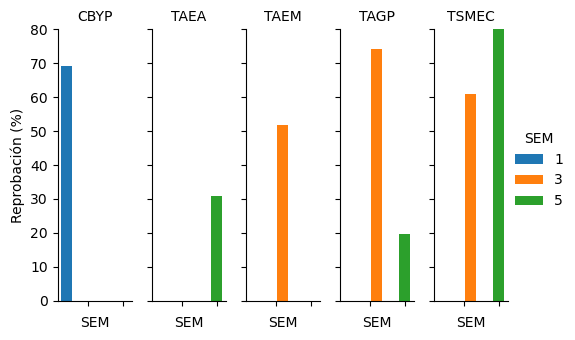

In [66]:


# ploteo por semestre
out_al['SEM'] = out_al['SEM']
graph = sns.FacetGrid(out_al, col ='CARR', hue='SEM',height=3.5,aspect=0.3).set(xticklabels=[])

# map the above form facetgrid with some attributes
graph.map(plt.bar, 'SEM', 'Rep%', label ='Rep%')
graph.set_titles(row_template = '{row_name}', col_template = '{col_name}')
graph.set_axis_labels("SEM", "Reprobación (%)")
graph.add_legend()
plt.ylim(0,80)
plt.show()



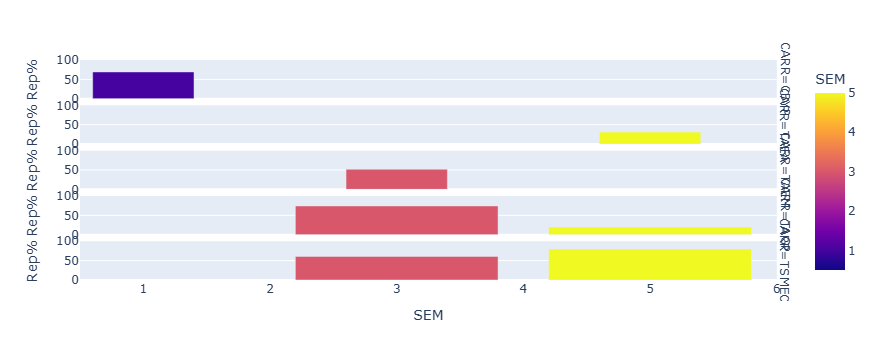

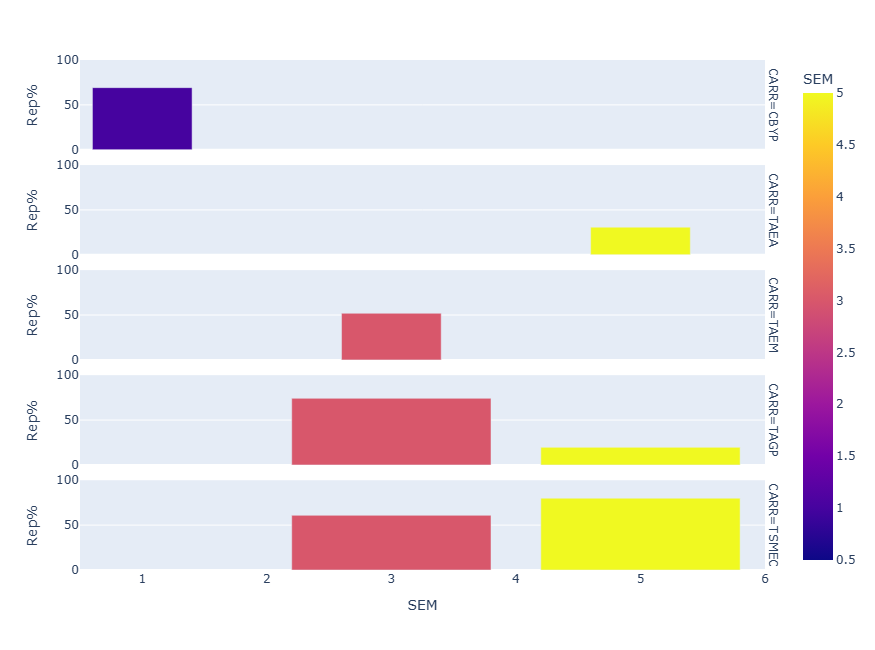

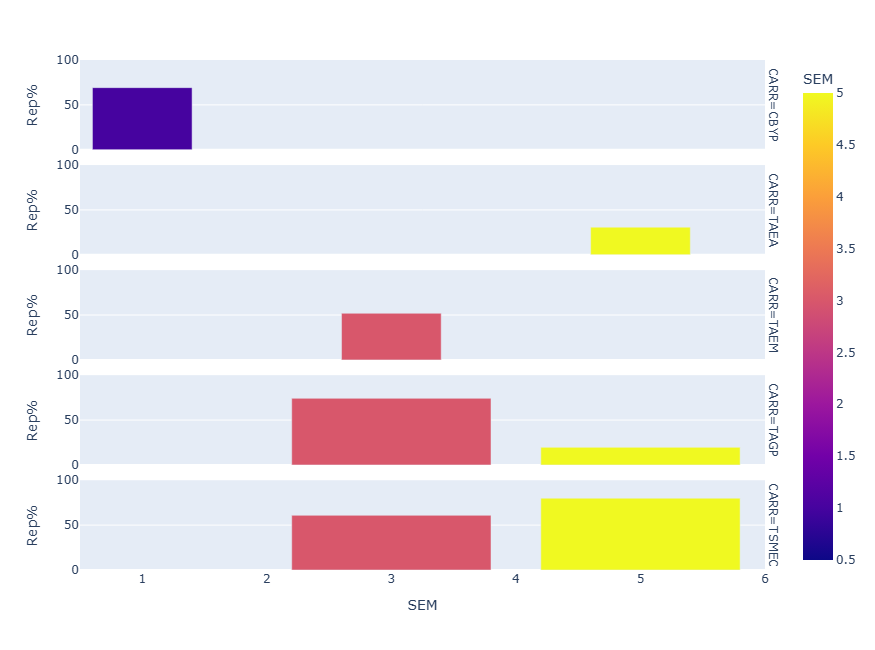

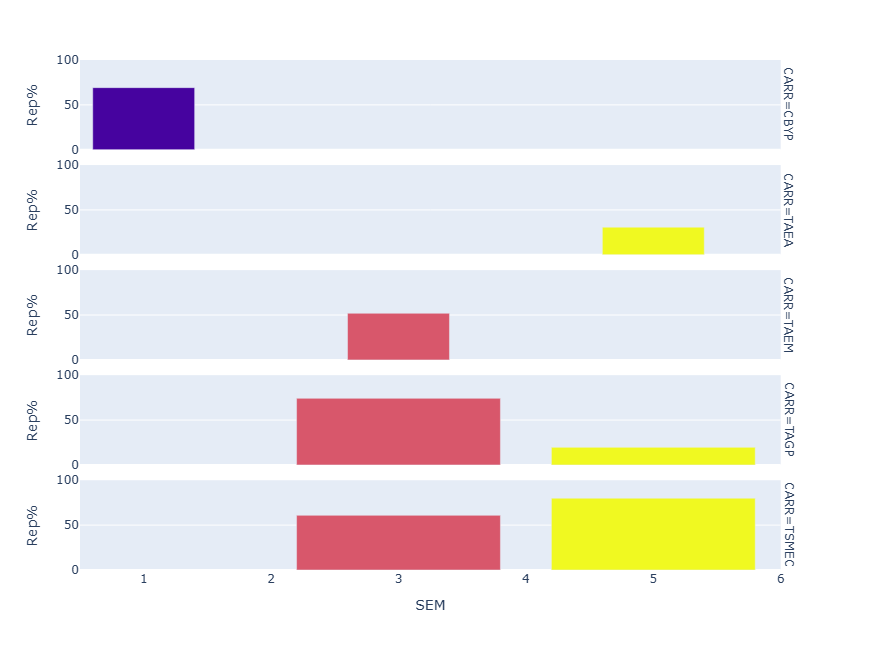

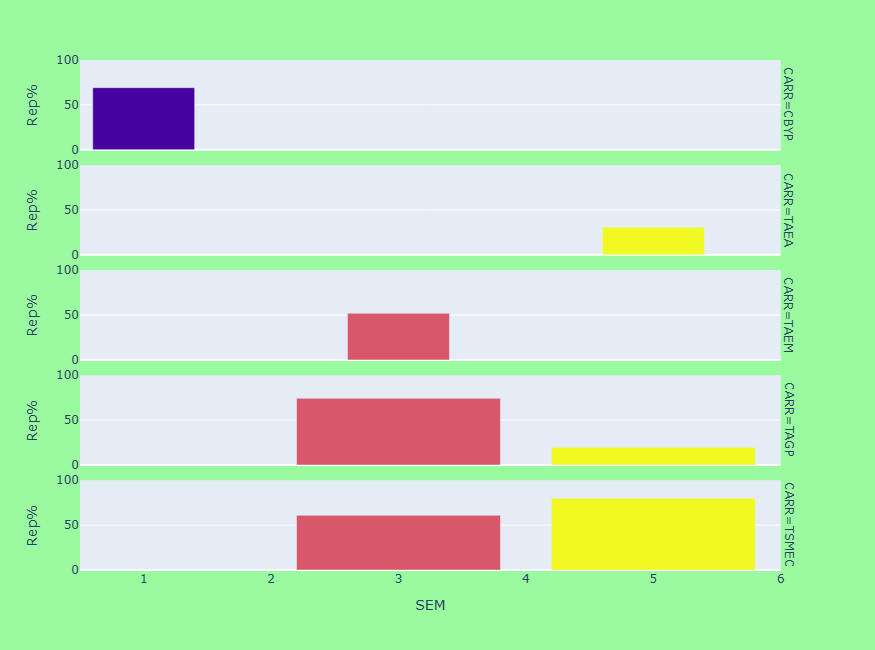

ValueError: 
    Invalid value of type 'builtins.str' received for the 'plot_bgcolor' property of layout
        Received value: 'CARR'

    The 'plot_bgcolor' property is a color and may be specified as:
      - A hex string (e.g. '#ff0000')
      - An rgb/rgba string (e.g. 'rgb(255,0,0)')
      - An hsl/hsla string (e.g. 'hsl(0,100%,50%)')
      - An hsv/hsva string (e.g. 'hsv(0,100%,100%)')
      - A named CSS color: see https://plotly.com/python/css-colors/ for a list

In [67]:
fig2 = px.bar(tabla_reprobados, x="SEM", y="Rep%", color = "SEM", facet_row="CARR")
fig2.update_yaxes(range=[0, 100])
fig2.update_layout(width=325, height=650)
fig2.update_layout(showlegend=False)
fig2.update_coloraxes(showscale=False)
fig2.update_layout(paper_bgcolor='#9afaa0') 
fig2.update_layout(plot_bgcolor='CARR') 
fig2.update_layout(font=dict(
        family="Courier New, monospace",
        size=5,  # Set the font size here
        color="RebeccaPurple"
    )) 

In [ ]:
fig2.show()

In [68]:
apair = list()
for i,j in zip(out['CARR'], out['SEM']):
    salida = i + '-' + str(k) 
    apair.append(salida)
out['ID3'] = apair
# Hemos generado un ID para relacionar "g"

In [69]:
out = pd.merge(g, out, left_on='ID2', right_on='ID3', how='right').drop('ID2', axis=1)
out['nRepro'] = round((out.nRepro/out.nAlumnos)*100,1)
out = out.rename(columns={'SEM_y':'SEM'})


In [70]:
down =cbx.loc[cbx['CALIF']<6]

apair = list()
for i,j,k,l in zip(down['NCONT'],down['PAT'],down['MAT'], down['NOM']):
    salida = str(i) + '-' + str(j) + ' ' + str(k) + ' '+ str(l)
    apair.append(salida)
down['NOMINE']=apair

down =down.groupby(['CARR','GPO','NOMINE']).agg({'NCONT':'count'})
down=down.rename(columns={'NCONT':'CONT'})

down = down.reset_index()
down['idx']=[f"{a} {b}" for a,b in zip(down.NOMINE,down.GPO)]

C:\Users\Rene\AppData\Local\Temp\ipykernel_3448\2763956285.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [71]:


print('Número de asignaturas reprobadas por cada uno de los alumnos en reprobación.')
down2 = down.iloc[:,[0,4,3]].sort_values('CONT',ascending=False).loc[:,['idx','CARR','CONT']].sort_values('CONT',ascending=False)
down2 = down2.reset_index()
down2 = down2.rename(columns={'CONT':'Materias reprobadas'})
down2 = down2.iloc[:,[1,2,3]]
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):  # more options can be specified also
    display(down2)



Número de asignaturas reprobadas por cada uno de los alumnos en reprobación.


,idx,CARR,Materias reprobadas
0,23101012050036-MARMOLEJO ALVAREZ ANA JAZMIN 5A,TAGP,8
1,24301060800277-LUEVANO LARIZ ITZEL ALEJANDRA 1B,CBYP,7
2,25101012050100-REYES REYES KEVIN JOSUE 1A,CBYP,7
3,25101012050084-RODRIGUEZ VARGAS KEVIN ALEJANDRO 1A,CBYP,7
4,25101012050042-GARCIA GONZALEZ RUBEN ARMANDO 1B,CBYP,7
5,25101012050033-ALONSO HERNANDEZ DANIEL 1A,CBYP,7
6,25101012050102-DAVILA MACIAS LUIS FELIPE 1B,CBYP,7
7,25101012050094-ZAMARRIPA CONTRERAS JESUS ALEJANDRO 1B,CBYP,7
8,24101012050116-PEREZ PALACIOS ANGEL DAVID 1A,CBYP,7
9,25101012050078-SERRANO CONTRERAS ADAMARIS MARIEL 1C,CBYP,7


In [72]:
asigna =cbx.loc[cbx['CALIF']<18]

apair = list()
for i,j,k,l in zip(asigna['NCONT'],asigna['PAT'],asigna['MAT'], asigna['NOM']):
    salida = str(i) + '-' + str(j) + ' ' + str(k) + ' '+ str(l)
    apair.append(salida)
asigna['NOMINE']=apair

asigna =asigna.groupby(['CARR','GPO','NCONT','NOMINE']).agg({'ASIG':'count'})
asigna=asigna.rename(columns={'ASIG':'ASIGS'})

asigna = asigna.reset_index()
asigna['idy']=[f"{a} {b}" for a,b in zip(asigna.NOMINE,asigna.GPO)]
#destacados['perc']=round((destacados.CONT/destacados.ASIGS)*100,1)

In [73]:
arepy = cbx.loc[(cbx['CALIF']<6) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
asig_most_frec = arepy.groupby(['CARR','SEM'])['ASIG'].agg(lambda x: x.value_counts().idxmax())

asig_most_frec =  asig_most_frec.to_frame()
asig_most_frec = asig_most_frec.reset_index()
asig_most_frec = asig_most_frec.loc[:,['CARR','SEM','ASIG']]



asig_most_frec_count = arepy.groupby(['CARR','SEM'])['ASIG'].agg(lambda x: x.value_counts().max())
asig_most_frec_count = asig_most_frec_count.to_frame()
asig_most_frec_count = asig_most_frec_count.reset_index()
asig_most_frec_count = asig_most_frec_count.rename(columns = {'ASIG':'COUNT'})


asig_most_frec_final = pd.concat([asig_most_frec.iloc[:,[0,1,2]], asig_most_frec_count.iloc[:,[2]]], axis=1)

asig_most_frec_final

,CARR,SEM,ASIG,COUNT
0,CBYP,1,PMT1,77
1,TAEA,5,EPVD,3
2,TAEM,3,Realiza estudio de mercado para determinar la ...,11
3,TAGP,3,Maneja aves y especies alternas para la produc...,14
4,TAGP,5,EPVD,7
5,TSMEC,3,Humanidades II,9
6,TSMEC,5,Temas selectos de matemáticas II,9


In [74]:
arepx = cbx.loc[(cbx['PAR1']<6) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
by_group = arepx.groupby(['CARR','SEM','CURP','PAT','MAT','NOM'])['ASIG'].unique()
by_group =  by_group.to_frame()
by_group = by_group.reset_index()
by_group
by_group = by_group.loc[:,['CARR','SEM','PAT','MAT','NOM','ASIG']]
by_group_asigs_rep = by_group
with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):  # more options can be specified also
    display(by_group_asigs_rep)


,CARR,SEM,CURP,PAT,MAT,NOM,ASIG
0,CBYP,1,AAEK091125MASMSRA1,AMADOR,ESPARZA,KARLA ELIZABETH,"[LCM1, CDIG1, CSOC1, ING1]"
1,CBYP,1,AOHD100326HASLRNA1,ALONSO,HERNANDEZ,DANIEL,"[PFyH1, LCM1, ING1, PMT1, CDIG1, CSOC1, CNAT1]"
2,CBYP,1,AURK090511MASGNMA6,AGUILAR,RANGEL,KIMBERLY GUADALUPE,"[LCM1, ING1, PMT1, CDIG1, CSOC1]"
3,CBYP,1,BALK100619HASZPVA5,BAEZ,LOPEZ,KEVIN SANTIAGO,"[PFyH1, ING1, PMT1, CDIG1, CSOC1, CNAT1]"
4,CBYP,1,BASA081205HASZRNA4,BAEZ,SERRANO,ANGEL JAVIER,"[PMT1, CDIG1, CSOC1, CNAT1]"
...,...,...,...,...,...,...,...
152,TSMEC,5,RORA080913HASDVNA1,RODRIGUEZ,RIVERA,ANGEL ESTEBAN,[Clasifica los elementos básicos de la red LAN...
153,TSMEC,5,TEME081023HASRRLA2,TREJO,MARTINEZ,ELVIS JETER,"[Diseña la red LAN, Temas selectos de matemáti..."
154,TSMEC,5,TOLF080806MASRPTA4,TORRES,LOPEZ,FATIMA JAZMIN,"[Diseña la red LAN, Clasifica los elementos bá..."
155,TSMEC,5,VISL080531HMCLNSA5,VILCHIS,SANTOS,LUIS DANIEL,[Clasifica los elementos básicos de la red LAN...


,CARR,SEM,PAT,MAT,NOM,ASIG
0,CBYP,1,AMADOR,ESPARZA,KARLA ELIZABETH,"[LCM1, CDIG1, CSOC1, ING1]"
1,CBYP,1,ALONSO,HERNANDEZ,DANIEL,"[PFyH1, LCM1, ING1, PMT1, CDIG1, CSOC1, CNAT1]"
2,CBYP,1,AGUILAR,RANGEL,KIMBERLY GUADALUPE,"[LCM1, ING1, PMT1, CDIG1, CSOC1]"
3,CBYP,1,BAEZ,LOPEZ,KEVIN SANTIAGO,"[PFyH1, ING1, PMT1, CDIG1, CSOC1, CNAT1]"
4,CBYP,1,BAEZ,SERRANO,ANGEL JAVIER,"[PMT1, CDIG1, CSOC1, CNAT1]"
5,CBYP,1,BELTRAN,SANCHEZ,ARLETHE ESTRELLA,[CSOC1]
6,CBYP,1,BONILLA,ROMO,RUTH,[PMT1]
7,CBYP,1,BUENROSTRO,HERREA,KEVIN EDUARDO,"[PMT1, ING1]"
8,CBYP,1,BUENDIA,HERRERA,VANIA MARISOL,"[CNAT1, PFyH1, LCM1, PMT1, CDIG1, CSOC1]"
9,CBYP,1,CASTORENA,CASTAÑEDA,ERIK GERARDO,"[PMT1, CDIG1]"


In [75]:
# CANTIDAD DE ALUMNOS CON REGISTRO DE CALIFICACIÓN EN CByP USANDO XLSX PARCIAL 2

matricula = len(cbx['NCONT'].unique())
matricula

293

<h1 style="color:red;">ALUMNOS EN RIESGO</h1>

In [76]:
meet = pd.merge(down, asigna, left_on='idx', right_on='idy', how='left').drop('idy', axis=1)

meet['%'] = round((meet.CONT/meet.ASIGS)*100,1)
meet['Ratio'] = meet['CONT'].map(str) + '/' + meet['ASIGS'].map(str)
meet = meet.rename(columns={'NOMINE_y':'NOMINE'})
meet =meet.loc[meet['%']>40].sort_values(['%'],ascending=False)
meet = meet.reset_index()

alumnos_en_riesgo = meet.loc[:,['idx','%','Ratio']]
alumnos_en_riesgo = alumnos_en_riesgo.rename(columns={'idx':'NOM'})
en_riesgo = len(alumnos_en_riesgo)
en_riesgo

print('Hay 57 alumnos con más del 40% de sus asignaturas reprobadas. Por ejemplo: AVALOS ESCOBAR NANCY LIZBETH reprobó 6 de las 6 materias que cursa, es decir, reprobó el 100% de sus asignaturas. Para fines de este documento, llamaremos a estos alumnos "Alumnos rezagados".')

with pd.option_context('display.max_rows', None, 'display.max_columns', None, 'display.max_colwidth', None):  # more options can be specified also
     display(alumnos_en_riesgo)



85

Hay 57 alumnos con más del 40% de sus asignaturas reprobadas. Por ejemplo: AVALOS ESCOBAR NANCY LIZBETH reprobó 6 de las 6 materias que cursa, es decir, reprobó el 100% de sus asignaturas. Para fines de este documento, llamaremos a estos alumnos "Alumnos rezagados".


,NOM,%,Ratio
0,24101012050116-PEREZ PALACIOS ANGEL DAVID 1A,100.0,7/7
1,24301060800277-LUEVANO LARIZ ITZEL ALEJANDRA 1B,100.0,7/7
2,25101012050100-REYES REYES KEVIN JOSUE 1A,100.0,7/7
3,25101012050084-RODRIGUEZ VARGAS KEVIN ALEJANDRO 1A,100.0,7/7
4,25101012050033-ALONSO HERNANDEZ DANIEL 1A,100.0,7/7
5,25101012050080-DURON MEDINA ANGEL SALVADOR 1D,100.0,7/7
6,25101012050088-ZAMARRIPA MORENO WILLIAAN ORLANDO 1D,100.0,7/7
7,25101012050077-SALINAS GONZALEZ HUMBERTO BENJAMIN 1C,100.0,7/7
8,25101012050078-SERRANO CONTRERAS ADAMARIS MARIEL 1C,100.0,7/7
9,25101012050096-GARCIA SANCHEZ IRVING DE JESUS 1B,100.0,7/7


In [77]:
todas = len(alumnos_en_riesgo[alumnos_en_riesgo['%']== 100])

In [78]:
riesgo_perc= round((en_riesgo/matricula)*100,2)
riesgo_perc

29.01

In [79]:


arep1 = cbx.loc[(cbx['CALIF']<6) & (cbx['PERIODO'] == 'SEMESTRAL 2 - 2024')]
arep1 = arep1.groupby(['CARR','SEM','GPO','PAT','MAT','NOM'])['CURP'].count()
arep1 = arep1.reset_index()
arep1=arep1.rename(columns={'CURP':'nCasos'})
arep1=arep1.sort_values(['nCasos'],ascending=False)
arep1 = arep1.reset_index()
arep1 = arep1.iloc[:,[1,2,3,4,5,6,7]]
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(arep1)



,CARR,SEM,GPO,PAT,MAT,NOM,nCasos


In [80]:
arep1 = cbx.loc[(cbx['CALIF']<6) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
arep1 = arep1.groupby(['CARR','GPO','SEM','PAT','MAT','NOM'])['NCONT'].count()
arep1 = arep1.reset_index()
arep1=arep1.rename(columns={'NCONT':'nCasos'})
#with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
#    display(arep1.sort_values(['CARR','SEM','GPO','PAT']))

In [81]:
apair = list()
for i,j,k in zip(arep1['CARR'],arep1['GPO'], arep1['SEM']):
    salida = i + '-' + str(k) + '-' + j
    apair.append(salida)
arep1['ID2']=apair
# Hemos generado un ID para "arep1"

In [82]:
# Relacionaremos "a" con "arep1" a través de sus ID's
# calcularemos el % reprobación por semestre

#arep2 = pd.concat([a, arep1],axis=1, join = 'inner')
arep2 = pd.merge(a, arep1, left_on='ID0', right_on='ID2', how='right').drop('ID0', axis=1)
arep2['REP_SEM'] = round((arep2.nCasos/arep2.nAlumnos)*100,1)
arep2 = arep2.rename(columns={'SEM_y':'SEM'})


In [83]:
arep2 = arep2.rename(columns={'CARR_x':'CARR','GPO_y':'GPO'})
arep2.drop(['CARR_y','GPO_x','SEM_x'], inplace=True,axis=1)

In [84]:
# Extraer todas las calificaciones reprobatorias de n-2024 y agrupar por asignatura

arep1b = cbx.loc[(cbx['CALIF']<6) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
arep1b = arep1b.groupby(['CARR','GPO','SEM','ASIG'])['NCONT'].nunique()
arep1b = arep1b.reset_index()
arep1b=arep1b.rename(columns={'NCONT':'nCasos'})

In [85]:
apair = list()
for i,j,k,l in zip(arep1b['CARR'],arep1b['GPO'], arep1b['SEM'], arep1b['ASIG']):
    salida = i + '-' + str(k) + '-' +j + '-' + l
    apair.append(salida)
arep1b['ID3']=apair

# Hemos generado in ID para arep1b

In [86]:
# Relacionaremoso "b" con "arep1b" a través de sus campos ID's
# obtendremos el % de reprobación por asignatura

arep2b = pd.merge(b, arep1b, left_on='ID1', right_on='ID3', how='right').drop('ID1', axis=1)
arep2b['REP_ASIG'] = round((arep2b.nCasos/arep2b.nAlumnos)*100,1)
arep2b = arep2b.rename(columns={'SEM_y':'SEM'})
arep2b = arep2b.rename(columns={'CARR_x':'CARR','GPO_y':'GPO','ASIG_x':'ASIG'})
arep2b.drop(['CARR_y','GPO_x','SEM_x','ASIG_y'], inplace=True,axis=1)

In [87]:
cbx.columns

Index(['PLANTEL', 'CARR', 'GEN', 'TURNO', 'SEM', 'GPO', 'NCONT', 'NOM', 'PAT',
       'MAT', 'CURP', 'ASIG', 'DOC', 'RFCDOC', 'PAR1', 'PAR2', 'PAR3', 'CALIF',
       'AS1', 'AS2', 'AS3', 'PERIODO', 'FIRMADO', 'SEX'],
      dtype='object')

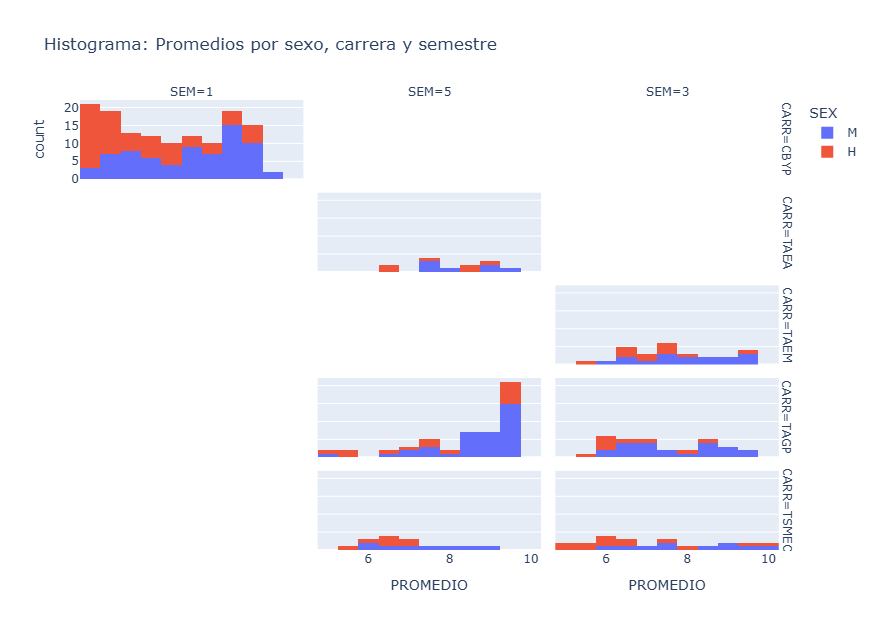

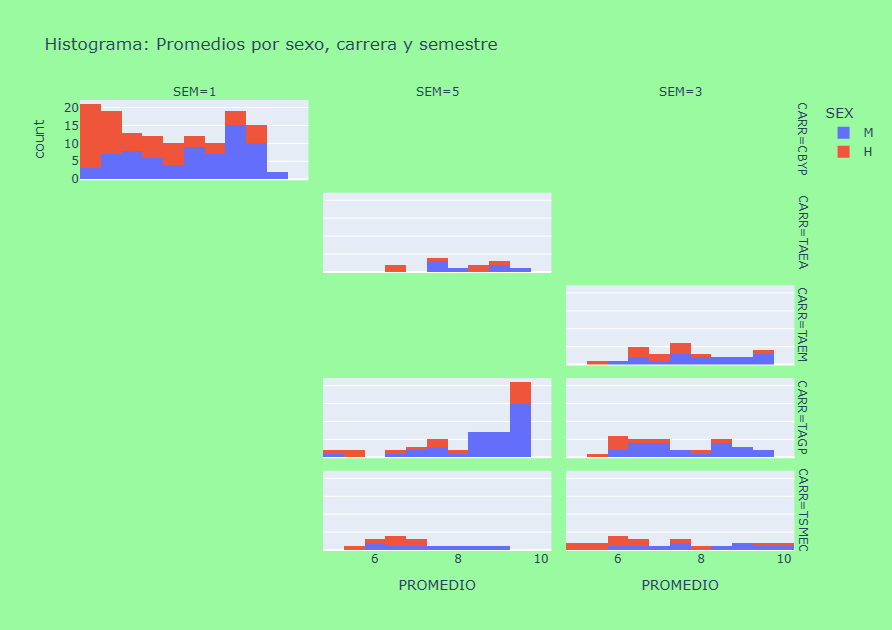

In [88]:
# HISTOGRAMA DE PROMEDIO POR CARRERA SEPARADO POR SEXO
cbx_par1 = cbx.groupby(['CARR','SEM','CURP','SEX'])['CALIF'].agg(['mean'])
cbx_par1 = cbx_par1.reset_index()
cbx_par1 = cbx_par1.rename(columns={'mean':'PROMEDIO'})

fig3 = px.histogram(cbx_par1, x="PROMEDIO", color="SEX", marginal="rug", facet_row = "CARR", facet_col = "SEM",
                   labels={'x':'PROMEDIO', 'y':'N° ALUMNOS'}, title="Histograma:\nPromedios por sexo, carrera y semestre")
fig3.update_layout(width=480, height=630)
fig3.update_layout(paper_bgcolor='#9afaa0')

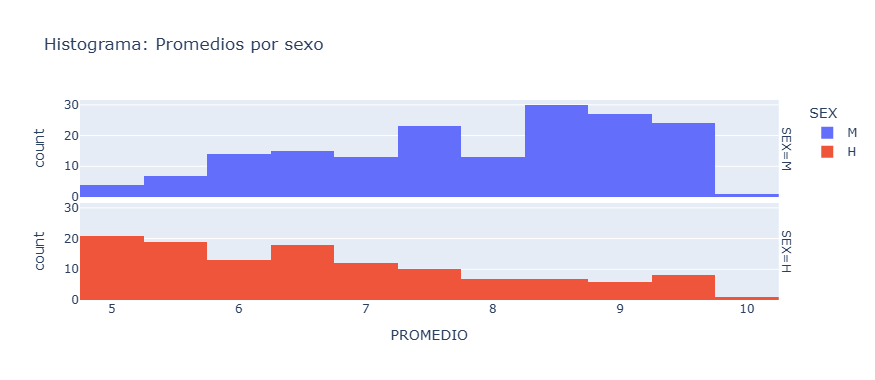

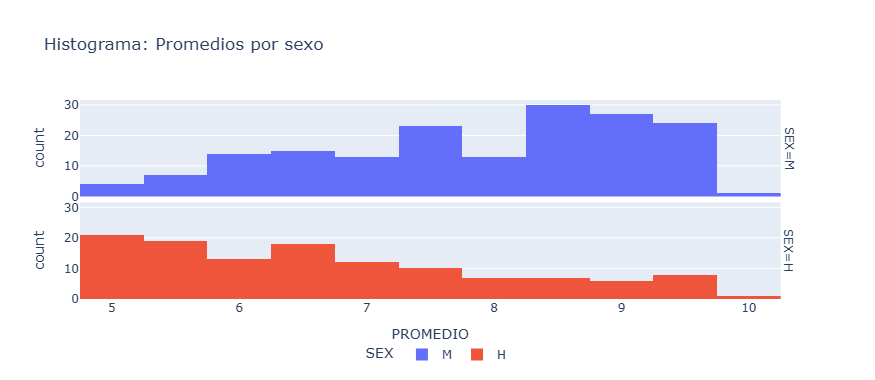

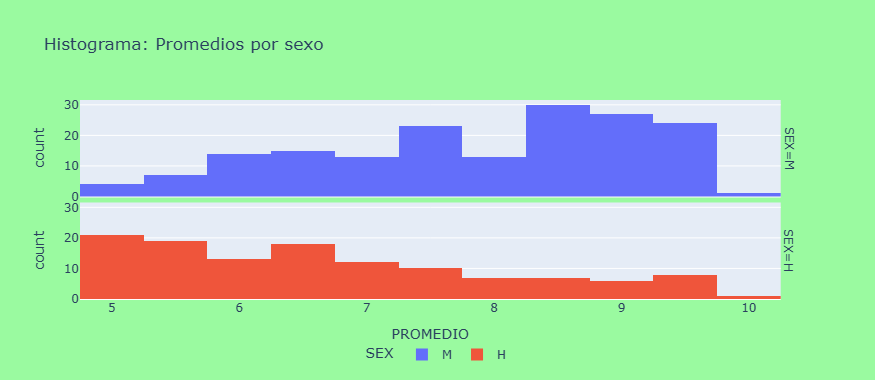

IndexError: single positional indexer is out-of-bounds

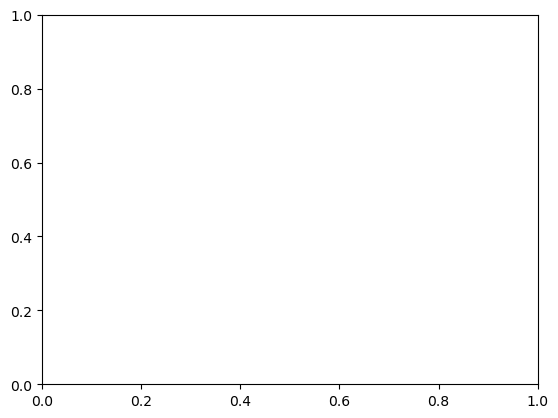

In [89]:
# HISTOGRAMA DE PROMEDIO GENERAL SEPARADO POR SEXO
cbx_par1 = cbx.groupby(['CARR','SEM','CURP','SEX'])['PAR1'].agg(['mean'])
cbx_par1 = cbx_par1.reset_index()
cbx_par1 = cbx_par1.rename(columns={'mean':'PROMEDIO'})

fig3 = px.histogram(cbx_par1, x="PROMEDIO", color="SEX", marginal="rug", facet_row = "SEX",
                   labels={'x':'PROMEDIO', 'y':'N° ALUMNOS'}, title="Histograma:\nPromedios por sexo")
fig3.update_layout(width=293, height=380)
fig3.update_layout(legend=dict(orientation="h", yanchor="top", y=-0.2, xanchor="center", x=0.5))
fig3.update_layout(paper_bgcolor='#9afaa0')




# plot:
fig, ax = plt.subplots()

ax.hist(cbx_par1.iloc[:,5], bins=5, linewidth=0.5, edgecolor="white", color="SEX")

ax.set(xlim=(4, 11), xticks=np.arange(4, 11))

plt.show()


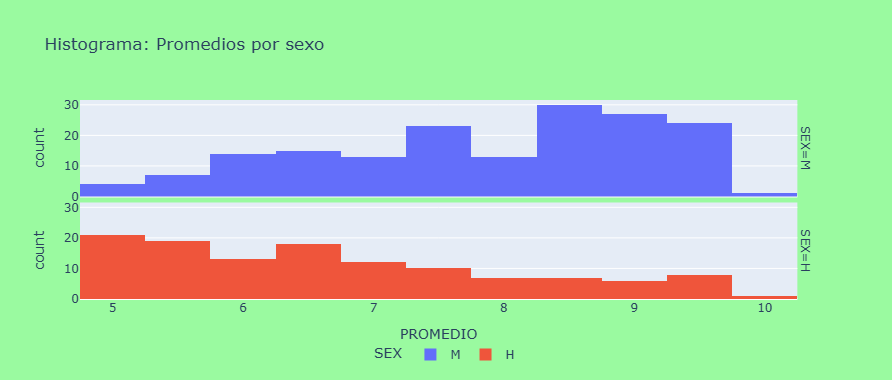

In [90]:
fig3.show()

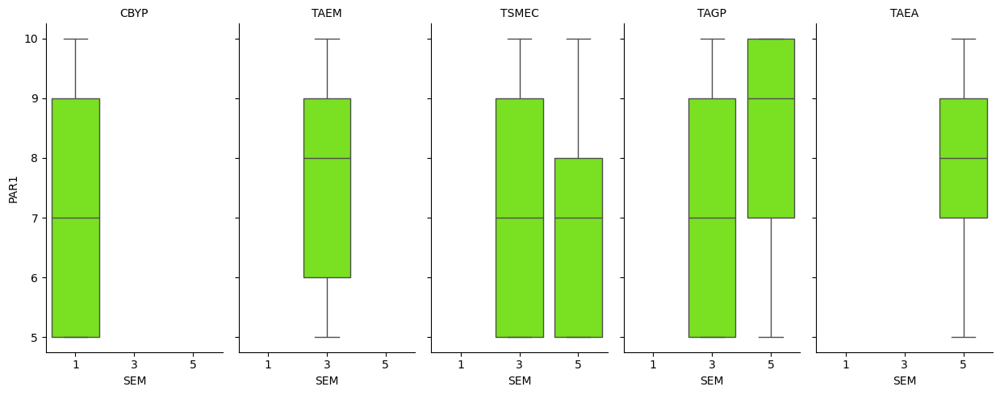

In [91]:
#de la base de datos inicial solo vamos a extraer lo correspondiente a 2-2024 y plotear
# el comportamiento de las calificaciones registradas --Distribución General de Calificaciones-- 
# por carrera y semestre

cbx_2025 = cbx.loc[cbx['PERIODO']== 'SEMESTRAL 1 - 2025'].sort_values('GPO')
g = sns.FacetGrid(cbx_2025, col = 'CARR',height=5,aspect=0.5)
g.map_dataframe(sns.boxplot, x='SEM', y ='PAR1', color='#76FF03')
g.set_titles(row_template = '{row_name}', col_template = '{col_name}')
g

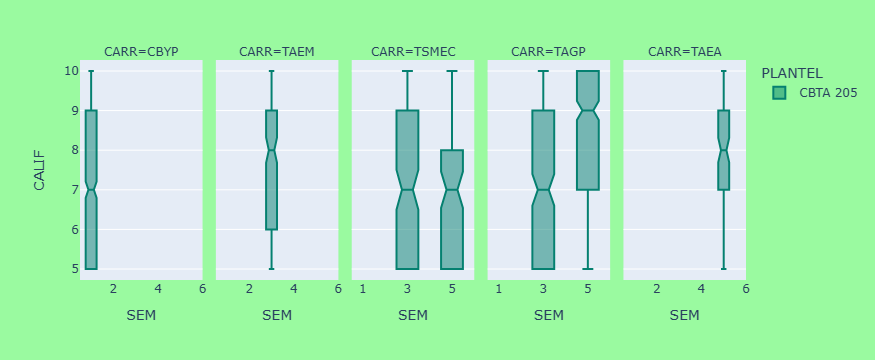

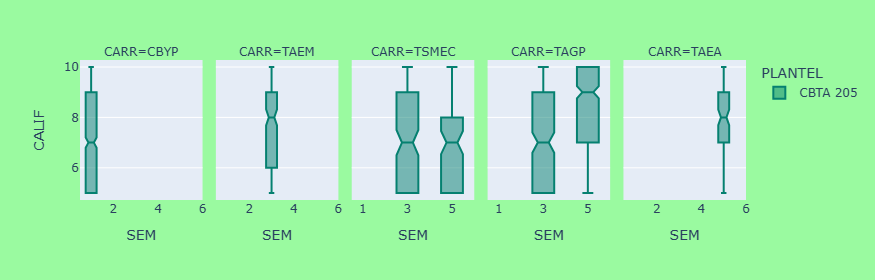

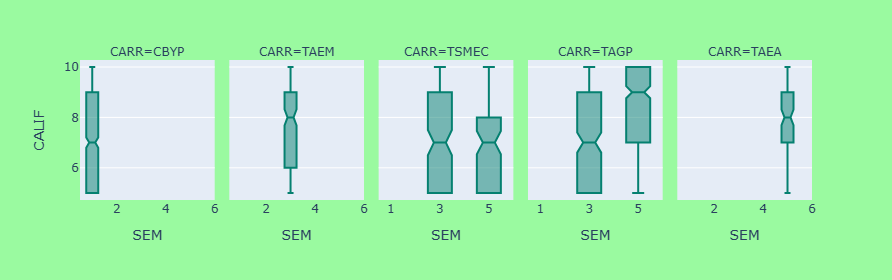

In [92]:

g1 = px.box(cbx_2025, x="SEM", y="CALIF", facet_col='CARR',
          notched=True, color = 'PLANTEL', points="outliers",
          color_discrete_map = {"CBTA 205": "#058070"})
g1.update_layout(paper_bgcolor='#9afaa0') 
g1.update_layout(height=280)
g1.update_layout(showlegend=False) 

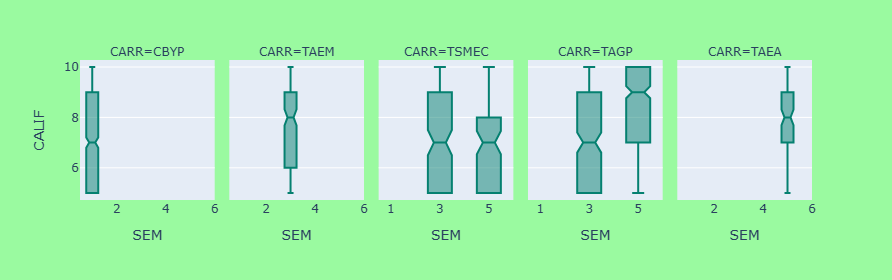

In [93]:
g1.show()

<h1 style="color:red;">MATRICULA</h1>

In [94]:
# CANTIDAD DE ALUMNOS CON REGISTRO DE CALIFICACIÓN EN CByP USANDO XLSX PARCIAL 2

matricula = len(cbx['NCONT'].unique())
matricula

293

In [95]:
signed_calif = cbx.groupby(['CARR'])['NCONT'].nunique()
signed_calif=signed_calif.reset_index()
print(signed_calif)
signed_calif2 = signed_calif['NCONT'].agg({'sum'})
print(" ")
print("Total de alumnos con calificación en carreras: ",signed_calif2)

    CARR  NCONT
0   CBYP    133
1   TAEA     13
2   TAEM     27
3   TAGP     82
4  TSMEC     38
 
Total de alumnos con calificación en carreras:  sum    293
Name: NCONT, dtype: int64


In [96]:
mat_por_carrera = signed_calif
mat_por_carrera

,CARR,NCONT
0,CBYP,133
1,TAEA,13
2,TAEM,27
3,TAGP,82
4,TSMEC,38


In [97]:
signed_califx = cbx.groupby(['SEM','CARR'])['NCONT'].nunique()
signed_califx=signed_califx.reset_index()
signed_calif3 = signed_califx['NCONT'].agg({'sum'})
signed_califx = signed_califx.rename(columns={'NCONT':'MATRICULA'})
print(signed_califx)

print(" ")
print("Total de alumnos con calificación en carreras: ",signed_calif3)

mat_por_gpo = signed_califx
mat_por_gpo

   SEM   CARR  MATRICULA
0    1   CBYP        133
1    3   TAEM         27
2    3   TAGP         31
3    3  TSMEC         23
4    5   TAEA         13
5    5   TAGP         51
6    5  TSMEC         15
 
Total de alumnos con calificación en carreras:  sum    293
Name: NCONT, dtype: int64


,SEM,CARR,MATRICULA
0,1,CBYP,133
1,3,TAEM,27
2,3,TAGP,31
3,3,TSMEC,23
4,5,TAEA,13
5,5,TAGP,51
6,5,TSMEC,15


<h1 style="color:red;">REPROBADOS</h1>

In [98]:
repro = cbx.loc[(cbx['CALIF']<=5) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
repro = repro.groupby(['CARR','SEM','GPO','PAT','MAT','NOM'])['CURP'].count()
cont_reprobados = len(repro)
cont_reprobados

157

In [99]:
reprobados = cbx.loc[(cbx['CALIF']<=5) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]['NCONT'].nunique()

reprobados

169

In [100]:

reprobados =cbx.loc[cbx['CALIF']<6].groupby(['CARR','GPO','SEM','NCONT']).agg({'NCONT':'count'})
reprobados=reprobados.rename(columns={'NCONT':'CONT'})
reprobados = reprobados.reset_index()
len(reprobados)

169

In [101]:
reprobados =cbx.loc[cbx['CALIF']<6].groupby(['CARR','GPO','NCONT']).agg({'NCONT':'count'})
reprobados=reprobados.rename(columns={'NCONT':'CONT'})
reprobados = reprobados.reset_index()
len(reprobados)

169

In [102]:
print("El total de alumnos con alguna calificación reprobatoria: ", len(reprobados))

El total de alumnos con alguna calificación reprobatoria:  169


In [103]:
repro_perc = round((len(reprobados)/signed_calif3)*100,2)
repro_perc = repro_perc[0]
repro_perc

C:\Users\Rene\AppData\Local\Temp\ipykernel_3448\2162666714.py:2: FutureWarning:

Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`



np.float64(57.68)

In [104]:
#PARCIAL 1
print("El % de alumnos con alguna calificación reprobatoria es: ",str(round((len(reprobados)/signed_calif3)*100,2)))

El % de alumnos con alguna calificación reprobatoria es:  sum    57.68
Name: NCONT, dtype: float64


In [105]:
REP_mean2 = arep2b.groupby(['GPO','SEM','CARR','ASIG'])['REP_ASIG'].mean().round(2)
REP_mean2 = pd.DataFrame(REP_mean2)
REP_mean2 = REP_mean2.rename(columns={'REP_ASIG':'%Rep'})
REP_mean2 = REP_mean2.sort_values('%Rep',ascending=False)
REP_mean2 = REP_mean2.reset_index()

In [106]:
rep_asig = REP_mean2.sort_values(['%Rep','CARR'], ascending=False)
rep_asig

,GPO,SEM,CARR,ASIG,%Rep
0,1A,1,CBYP,PMT1,64.7
1,5A,5,TSMEC,Temas selectos de matemáticas II,60.0
2,1D,1,CBYP,PMT1,57.6
3,1C,1,CBYP,PMT1,54.5
4,1D,1,CBYP,CSOC1,54.5
...,...,...,...,...,...
63,3A,3,TAEM,Apoya el proceso de registro legal de producto...,7.4
64,5A,5,TAGP,PHORTOFRU,4.2
65,5A,5,TAGP,PRLACTEO,4.2
66,5A,5,TAGP,PPRODCARN,4.2


In [107]:
print('Porcentaje de reprobación observado en las asignaturas impartidas en cada uno de los grupos.')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(REP_mean2)

Porcentaje de reprobación observado en las asignaturas impartidas en cada uno de los grupos.


,GPO,SEM,CARR,ASIG,%Rep
0,1A,1,CBYP,PMT1,64.7
1,5A,5,TSMEC,Temas selectos de matemáticas II,60.0
2,1D,1,CBYP,PMT1,57.6
3,1C,1,CBYP,PMT1,54.5
4,1D,1,CBYP,CSOC1,54.5
5,1B,1,CBYP,PMT1,54.5
6,1D,1,CBYP,LCM1,51.5
7,1B,1,CBYP,CSOC1,48.5
8,1A,1,CBYP,CNAT1,47.1
9,1A,1,CBYP,CDIG1,47.1


In [108]:
"""

# ploteo por semestre
REP_mean2['ASIG'] = REP_mean2['ASIG'].apply(str)

graph = sns.FacetGrid(REP_mean2, col ='CARR', hue='SEM',height=9,aspect=0.3)

# map the above form facetgrid with some attributes
graph.map(plt.barh, 'ASIG', '%Rep')

graph.set_titles(row_template = '{row_name}', col_template = '{col_name}')
graph.set_axis_labels("REP (%)", "ASIG")
graph.add_legend()
#plt.subplots(figsize=(26, 22))

#plt.ylim(0,80)
plt.show()

"""

'\n\n# ploteo por semestre\nREP_mean2[\'ASIG\'] = REP_mean2[\'ASIG\'].apply(str)\n\ngraph = sns.FacetGrid(REP_mean2, col =\'CARR\', hue=\'SEM\',height=9,aspect=0.3)\n\n# map the above form facetgrid with some attributes\ngraph.map(plt.barh, \'ASIG\', \'%Rep\')\n\ngraph.set_titles(row_template = \'{row_name}\', col_template = \'{col_name}\')\ngraph.set_axis_labels("REP (%)", "ASIG")\ngraph.add_legend()\n#plt.subplots(figsize=(26, 22))\n\n#plt.ylim(0,80)\nplt.show()\n\n'

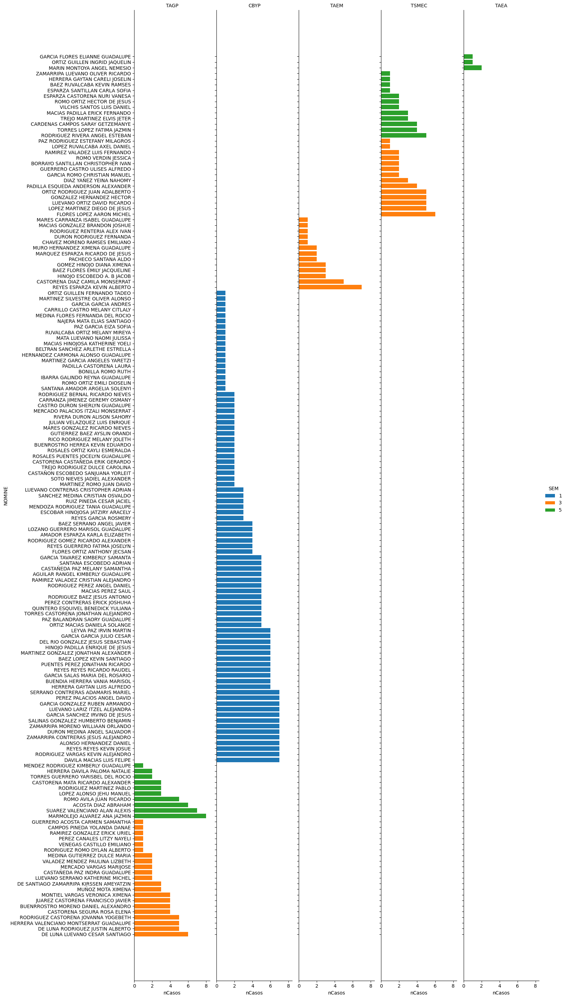

In [109]:


# ploteo por alumno
arep1 = cbx.loc[(cbx['CALIF']<6) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
arep1 = arep1.groupby(['CARR','GPO','SEM','PAT','MAT','NOM'])['NCONT'].count()
arep1 = arep1.reset_index()
arep1=arep1.rename(columns={'NCONT':'nCasos'})
arep1=arep1.sort_values(['nCasos'],ascending=False)

apair = list()
for i,j,k in zip(arep1['PAT'],arep1['MAT'], arep1['NOM']):
    salida = i + ' ' + str(j) + ' ' + k
    apair.append(salida)
arep1['NOMINE']=apair


arep1['NOMINE'] = arep1['NOMINE'].apply(str)

graph1 = sns.FacetGrid(arep1, col ='CARR', hue='SEM',height=29,aspect=0.11)

# map the above form facetgrid with some attributes
graph1.map(plt.barh, 'NOMINE', 'nCasos')

graph1.set_titles(row_template = '{row_name}', col_template = '{col_name}')
graph1.set_axis_labels("nCasos", "NOMINE")
graph1.add_legend()
#plt.subplots(figsize=(26, 22))

#plt.ylim(0,80)
plt.show()


In [110]:
arep1 = cbx.loc[(cbx['CALIF']<6) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
arep1 = arep1.groupby(['CARR','GPO','SEM','PAT','MAT','NOM'])['NCONT'].count()
arep1 = arep1.reset_index()
arep1=arep1.rename(columns={'NCONT':'nCasos'})
arep1=arep1.sort_values(['nCasos'],ascending=False)

apair = list()
for i,j,k in zip(arep1['PAT'],arep1['MAT'], arep1['NOM']):
    salida = i + ' ' + str(j) + ' ' + k
    apair.append(salida)
arep1['NOMINE']=apair

print('De lo anterior, obtenemos que el porcentaje de alumnos con al menos una materia reprobada:')
print(round(len(arep1['NOMINE'].unique())/len(cbx['NCONT'].unique())*100,2), ' %')

De lo anterior, obtenemos que el porcentaje de alumnos con al menos una materia reprobada:
53.58  %


In [111]:
al =  cbx.loc[(cbx['CALIF']<11) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
al = al.groupby(['CARR','SEM'])['NCONT'].nunique()
al = al.reset_index()
al = al.rename(columns={al.columns[2]:'nAlumnos'})


inn = cbx.loc[(cbx['CALIF']>8) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
inn = inn.groupby(['CARR','SEM'])['NCONT'].nunique()
inn = inn.reset_index()
inn = inn.rename(columns={inn.columns[2]:'nUpg'})


inn_al = al
inn_al['nUpg'] = pd.Series(inn['nUpg'])
inn_al['Upg%'] = round((inn_al.nUpg/inn_al.nAlumnos)*100,1)
inn_al

,CARR,SEM,nAlumnos,nUpg,Upg%
0,CBYP,1,133,82,61.7
1,TAEA,5,13,13,100.0
2,TAEM,3,27,26,96.3
3,TAGP,3,31,31,100.0
4,TAGP,5,51,45,88.2
5,TSMEC,3,23,19,82.6
6,TSMEC,5,15,12,80.0


In [112]:


check = cbx.loc[(cbx['CALIF']>8) & (cbx['CARR'] == 'CBYP') & (cbx['SEM'] == 1)]
check.groupby(['GPO','SEM'])['NCONT'].nunique()
print("En este gpo se observaron 10 alumnos con al menos una materia calificada con 9 0 10")

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(check)


GPO  SEM
1A   1      22
1B   1      21
1C   1      22
1D   1      17
Name: NCONT, dtype: int64

En este gpo se observaron 10 alumnos con al menos una materia calificada con 9 0 10


,PLANTEL,CARR,GEN,TURNO,SEM,GPO,NCONT,NOM,PAT,MAT,CURP,ASIG,DOC,RFCDOC,PAR1,PAR2,PAR3,CALIF,AS1,AS2,AS3,PERIODO,FIRMADO,SEX
59,CBTA 205,CBYP,2024 - 2027,matutino,1,1D,24101012050022,RICARDO NIEVES,RODRIGUEZ,BERNAL,ROBR090924HASDRCA0,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
65,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050015,KATHERINE YOELI,MACIAS,HINOJOSA,MAHK100717MASCNTA6,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
68,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050025,ARLETHE ESTRELLA,BELTRAN,SANCHEZ,BESA100530MASLNRA0,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
69,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050035,SHERLYN GUADALUPE,CASTRO,DURON,CADS100723MASSRHA5,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
70,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050037,SEBASTIAN,CRUZ,PALACIOS,CUPS100117HASRLBA1,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,10,NaN,NaN,10,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H
74,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050051,ESMERALDA,MORA,CALVILLO,MOCE101104MASRLSA3,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
76,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050056,ALISON SAHORY,RIVERA,DURON,RIDA090916MASVRLA7,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
77,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050057,HILARY GUADALUPE,GONZALEZ,RIVERA,GORH080506MASNVLA5,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,10,NaN,NaN,10,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
78,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050060,YATZIRI VALERIA,HERRERA,ORTIZ,HEOY100214MASRRTA7,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,10,NaN,NaN,10,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,M
79,CBTA 205,CBYP,2025 - 2028,matutino,1,1D,25101012050066,BRANDON,ORTIZ,VALENCIANO,OIVB100808HASRLRA5,CNAT1,AFRA YADIRA CAMARGO YAÑEZ,CAYA750327S56,9,NaN,NaN,9,9.0,NaN,NaN,SEMESTRAL 1 - 2025,NO FIRMADO,H


In [113]:
apair = list()
for i,j,k in zip(arep1['PAT'],arep1['MAT'], arep1['NOM']):
    salida = i + ' ' + str(j) + ' ' + k
    apair.append(salida)
arep1['NOMINE']=apair

In [114]:
arep1 = cbx.loc[(cbx['CALIF']>8) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]

apair = list()
for i,j,k,l in zip(arep1['NCONT'],arep1['PAT'],arep1['MAT'], arep1['NOM']):
    salida = str(i) + '-' + str(j) + ' ' + str(k) + ' '+ str(l)
    apair.append(salida)
arep1['NOMINE']=apair

arep1 = arep1.groupby(['CARR','GPO','SEM','NOMINE'])['NCONT'].count()
arep1 = arep1.reset_index()
arep1=arep1.rename(columns={'NCONT':'nCasos'})
arep1 =  arep1.sort_values(['nCasos'],ascending=False)
arep1 = arep1.reset_index()

with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(arep1)

C:\Users\Rene\AppData\Local\Temp\ipykernel_3448\154980478.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,index,CARR,GPO,SEM,NOMINE,nCasos
0,165,TAGP,5A,5,23101012050029-FLORES ARAIZA ANIBAL GABRIEL,8
1,167,TAGP,5A,5,23101012050040-VALADEZ ROMO GABRIELA,8
2,176,TAGP,5A,5,23101012050085-MACIAS GONZALEZ PAULINA YAKSEL,8
3,112,TAEM,3A,3,24101012050072-REYES REYES CAMILA,8
4,188,TAGP,5A,5,23101012050110-VALENCIA PASILLAS LUIS ANTONIO,7
5,161,TAGP,5A,5,23101012050021-PEREZ MACIAS SELENE GUADALUPE,7
6,152,TAGP,5A,5,13101012050613-RODRIGUEZ LANDEROS JANETH CRISTINA,7
7,196,TAGP,5A,5,23101012050128-SANCHEZ BAEZ MARIANA GUADALUPE,7
8,179,TAGP,5A,5,23101012050094-DIAZ ROMAN RICARDO,7
9,207,TSMEC,3A,3,24101012050054-MARTINEZ MARIN ELENA DEL ROSARIO,7


In [115]:
print('De lo anterior, obtenemos que el porcentaje de alumnos con al menos una materia con 9 o 10:')
print(round(len(arep1['NOMINE'].unique())/len(cbx['NCONT'].unique())*100,2), ' %')

De lo anterior, obtenemos que el porcentaje de alumnos con al menos una materia con 9 o 10:
77.82  %


<h1 style="color:red;">PROMEDIO INDIVIDUAL</h1>

In [116]:

arep1 = cbx.loc[(cbx['CALIF']<11) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]

apair = list()
for i,j,k,l in zip(arep1['NCONT'],arep1['PAT'],arep1['MAT'], arep1['NOM']):
    salida = str(i) + '-' + str(j) + ' ' + str(k) + ' '+ str(l)
    apair.append(salida)
arep1['NOMINE']=apair

#agg("mean", axis="columns")


arep1 = arep1.groupby(['CARR','GPO','SEM','NOMINE'])['PAR1'].agg('mean')

arep1 = arep1.reset_index()
arep1=arep1.rename(columns={'PAR1':'media'})
#arep1.media = arep1.media.round(2)
#arep1['media'] = arep1['media'].round(2)
arep1 = arep1.sort_values(['media'],ascending=False)
arep1 = arep1.reset_index()
arep1 = arep1.iloc[:,[1,2,4,5]]

promedio_individual = arep1


print('El promedio general del parcial I para cada alumno del plantel es:')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(promedio_individual)


El promedio general del parcial I para cada alumno del plantel es:


,CARR,GPO,NOMINE,media
0,TSMEC,3A,24101012050036-RODRIGUEZ nan IRWIN JAEL,10.0
1,TSMEC,3A,24101012050054-MARTINEZ MARIN ELENA DEL ROSARIO,9.857143
2,TSMEC,3A,24101012050114-VERDUZCO VAZQUEZ ANDRES,9.714286
3,TAGP,5A,23101012050021-PEREZ MACIAS SELENE GUADALUPE,9.625
4,TAGP,5A,23101012050040-VALADEZ ROMO GABRIELA,9.625
5,TAGP,5A,23101012050106-RODRIGUEZ NEGRETE SANJUANA DEL ...,9.571429
6,TAGP,5A,23101012050097-GUERRERO REYES ERENDIRA,9.571429
7,TAGP,5A,13101012050613-RODRIGUEZ LANDEROS JANETH CRISTINA,9.571429
8,TAGP,5A,13101012050638-GUERRERO SOTO ALONDRA ESTHER,9.571429
9,TAGP,5A,23101012050109-SAUCEDO LOPEZ KARLA MARIA,9.571429


In [117]:
promedio_individual.columns
promedio_individual = promedio_individual.rename(columns={'NOMINE':'NOMBRE', 'media':'PROMEDIO'})
promedio_individual['PROMEDIO'] = pd.to_numeric(promedio_individual['PROMEDIO'])
promedio_individual['PROMEDIO'] = promedio_individual['PROMEDIO'].round(1)
print("promedio individual de todos los alumnos sin agrupar ni por carrera, ni por semestre ni por grupo")
promedio_individual

Index(['CARR', 'GPO', 'NOMINE', 'media'], dtype='object')

promedio individual de todos los alumnos sin agrupar ni por carrera, ni por semestre ni por grupo


,CARR,GPO,NOMBRE,PROMEDIO
0,TSMEC,3A,24101012050036-RODRIGUEZ nan IRWIN JAEL,10.0
1,TSMEC,3A,24101012050054-MARTINEZ MARIN ELENA DEL ROSARIO,9.9
2,TSMEC,3A,24101012050114-VERDUZCO VAZQUEZ ANDRES,9.7
3,TAGP,5A,23101012050021-PEREZ MACIAS SELENE GUADALUPE,9.6
4,TAGP,5A,23101012050040-VALADEZ ROMO GABRIELA,9.6
...,...,...,...,...
288,CBYP,1B,25101012050094-ZAMARRIPA CONTRERAS JESUS ALEJA...,5.0
289,CBYP,1B,25101012050096-GARCIA SANCHEZ IRVING DE JESUS,5.0
290,CBYP,1B,25101012050102-DAVILA MACIAS LUIS FELIPE,5.0
291,CBYP,1C,25101012050077-SALINAS GONZALEZ HUMBERTO BENJAMIN,5.0


In [118]:
# promedio pero ahora ordenando resultados por grupo

In [119]:
arep1x = cbx.loc[(cbx['CALIF']<11) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]

apair = list()
for i,j,k,l in zip(arep1x['NCONT'],arep1x['PAT'],arep1x['MAT'], arep1x['NOM']):
    salida = str(i) + '-' + str(j) + ' ' + str(k) + ' '+ str(l)
    apair.append(salida)
arep1x['NOMINE']=apair

#agg("mean", axis="columns")


arep1x = arep1x.groupby(['CARR','SEM','NOMINE'])['CALIF'].agg('mean')
arep1x = arep1x.reset_index()


arep1x = arep1x.rename(columns={'CALIF':'media'})

#arep1.media = arep1.media.round(2)
#arep1['media'] = arep1['media'].round(2)
#arep1x = arep1x.sort_values(['media'],ascending=False)

arep1x['media'] = pd.to_numeric(arep1x['media'])
arep1x = arep1x.iloc[:,[0,1,2,3]]
arep1x.iloc[:,[3]] = round(arep1x.iloc[:,[3]] ,2)




promedio_general = arep1x

promedio_general = promedio_general.sort_values(['CARR','SEM','media'], ascending=False)

In [120]:
print("promedio individual de los alumnos pero agrupados por carrera y semestre")
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(promedio_general)

promedio individual de los alumnos pero agrupados por carrera y semestre


,CARR,SEM,NOMINE,media
282,TSMEC,5,23101012050044-OLAYO nan JAKSIRI GUADALUPE,9.14
287,TSMEC,5,23101012050066-TORRES DE LA CRUZ JASSILEY JAZMIN,8.71
285,TSMEC,5,23101012050060-HERRERA GAYTAN CARELI JOSELIN,7.86
286,TSMEC,5,23101012050061-HERNANDEZ ESCOBEDO FERNANDA SAN...,7.57
278,TSMEC,5,23101012050003-BAEZ RUVALCABA KEVIN RAMSES,7.14
280,TSMEC,5,23101012050009-ESPARZA SANTILLAN CARLA SOFIA,7.00
290,TSMEC,5,23101012050075-ZAMARRIPA LUEVANO OLIVER RICARDO,7.00
279,TSMEC,5,23101012050008-ESPARZA CASTORENA NURI VANESA,6.71
284,TSMEC,5,23101012050058-ROMO ORTIZ HECTOR DE JESUS,6.57
291,TSMEC,5,23101012050080-VILCHIS SANTOS LUIS DANIEL,6.57


In [121]:
reprobados['idx']=[f"{a} {b}" for a,b in zip(reprobados.CARR,reprobados.GPO)]

<h1 style="color:red;">MATRIZ</h1>

In [122]:
# how many asigments filed per student
print('Se muestra a continuación la cantidad de alumnos (por grupo) y que tienen 1,2,..., y hasta 9 asignaturas reprobadas')
outn = pd.DataFrame()
listado = []
for i in reprobados['CONT'].unique():
    outx = reprobados.loc[(reprobados['CONT']==i)].groupby('idx').nunique()
    listado.append(i)

    outn = pd.concat([outn,outx['NCONT']],axis=1)


outn.columns=listado
outn = outn.fillna(0)
outn = outn.reindex(sorted(outn.columns),axis=1)
outn = pd.DataFrame(outn)

for col in  outn.columns[0:]:
    outn[col] = pd.to_numeric(outn[col], downcast='integer', errors='coerce')

matriz = outn

Se muestra a continuación la cantidad de alumnos (por grupo) y que tienen 1,2,..., y hasta 9 asignaturas reprobadas


In [123]:
matriz = matriz.reset_index()
matriz = matriz.rename(columns={'index':'GPO/#ASIGS'})
matriz.columns = ['GPO','1\nAsig','2\nAsig','3\nAsig','4\nAsig','5\nAsig','6\nAsig','7\nAsig','8\nAsig']
matriz

,GPO,1\nAsig,2\nAsig,3\nAsig,4\nAsig,5\nAsig,6\nAsig,7\nAsig,8\nAsig
0,CBYP 1A,7,4,2,3,2,4,4,0
1,CBYP 1B,5,3,0,1,3,4,5,0
2,CBYP 1C,6,5,2,1,3,1,2,0
3,CBYP 1D,3,5,3,2,6,4,2,0
4,TAEM 3A,5,3,3,1,1,0,1,0
5,TAGP 3A,6,5,2,5,4,1,0,0
6,TAGP 5A,1,2,3,0,1,1,1,1
7,TSMEC 3A,2,5,1,1,4,1,0,0
8,TSMEC 5A,4,3,2,2,1,0,0,0
9,TAEA 5A,2,2,0,0,0,0,0,0


In [124]:
destacados =cbx.loc[cbx['CALIF']>8]

apair = list()
for i,j,k,l in zip(destacados['NCONT'],destacados['PAT'],destacados['MAT'], destacados['NOM']):
    salida = str(i) + '-' + str(j) + ' ' + str(k) + ' '+ str(l)
    apair.append(salida)
destacados['NOMINE']=apair

destacados =destacados.groupby(['CARR','GPO','NOMINE']).agg({'NCONT':'count'})
destacados=destacados.rename(columns={'NCONT':'CONT'})

destacados = destacados.reset_index()
destacados['idx']=[f"{a} {b}" for a,b in zip(destacados.NOMINE,destacados.GPO)]

C:\Users\Rene\AppData\Local\Temp\ipykernel_3448\4235685020.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [125]:
asigna =cbx.loc[cbx['CALIF']<18]

apair = list()
for i,j,k,l in zip(asigna['NCONT'],asigna['PAT'],asigna['MAT'], asigna['NOM']):
    salida = str(i) + '-' + str(j) + ' ' + str(k) + ' '+ str(l)
    apair.append(salida)
asigna['NOMINE']=apair

asigna =asigna.groupby(['CARR','GPO','NCONT','NOMINE']).agg({'ASIG':'count'})
asigna=asigna.rename(columns={'ASIG':'ASIGS'})

asigna = asigna.reset_index()
asigna['idy']=[f"{a} {b}" for a,b in zip(asigna.NOMINE,asigna.GPO)]
#destacados['perc']=round((destacados.CONT/destacados.ASIGS)*100,1)

In [126]:
coinci = pd.merge(destacados, asigna, left_on='idx', right_on='idy', how='left').drop('idy', axis=1)

coinci['%'] = round((coinci.CONT/coinci.ASIGS)*100,1)
coinci['Ratio'] = coinci['CONT'].map(str) + '/' + coinci['ASIGS'].map(str)
coinci = coinci.rename(columns={'NOMINE_y':'NOMINE'})
coinci =coinci.loc[coinci['%']>75].sort_values(['%'],ascending=False)
coinci = coinci.reset_index()
coinci = coinci.loc[:,['idx','%','Ratio']]
coinci = coinci.rename(columns={'idx':'NOM'})
tab_destacados = coinci

print('Hay 38 alumnos destacados que tuvieron calificaciones de 9 o de 10 en más del 75% de las asignaturas que están cursando. Por ejemplo: MONTOYA DE LUNA BLANCA JANETH obtuvo calificaciones de 9 o 10 en el 100% de sus asignaturas, es decir, en 7 de 7. Para fines de este documento, llamaremos a estos alumnos "Alumnos destacados".')
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(tab_destacados)



Hay 38 alumnos destacados que tuvieron calificaciones de 9 o de 10 en más del 75% de las asignaturas que están cursando. Por ejemplo: MONTOYA DE LUNA BLANCA JANETH obtuvo calificaciones de 9 o 10 en el 100% de sus asignaturas, es decir, en 7 de 7. Para fines de este documento, llamaremos a estos alumnos "Alumnos destacados".


,NOM,%,Ratio
0,23101012050085-MACIAS GONZALEZ PAULINA YAKSEL 5A,100.0,8/8
1,23101012050091-CASTORENA VILLALOBOS CITLALI 5A,100.0,7/7
2,23101012050096-FLORES RODRIGUEZ JOSE GUADALUPE 5A,100.0,7/7
3,13101012050638-GUERRERO SOTO ALONDRA ESTHER 5A,100.0,7/7
4,13101012050613-RODRIGUEZ LANDEROS JANETH CRIST...,100.0,7/7
5,24101012050072-REYES REYES CAMILA 3A,100.0,8/8
6,23101012050125-DURON URRUTIA JOSE GUADALUPE 5A,100.0,7/7
7,23101012050126-MACIAS OROZCO MIGUEL ANTONIO 5A,100.0,7/7
8,24101012050036-RODRIGUEZ nan IRWIN JAEL 3A,100.0,7/7
9,24101012050054-MARTINEZ MARIN ELENA DEL ROSARI...,100.0,7/7


In [127]:
tot_destacados = round(len(coinci['NOM'].unique()))
tot_destacados

38

In [128]:
print('De lo anterior, obtenemos que el porcentaje de Alumnos destacados es:')
print(round(len(coinci['NOM'].unique())/len(cbx['NCONT'].unique())*100,2), ' %')
destacados_perc = round(len(coinci['NOM'].unique())/len(cbx['NCONT'].unique())*100,2)
destacados_perc

De lo anterior, obtenemos que el porcentaje de Alumnos destacados es:
12.97  %


12.97

In [129]:
print('Se muestra a continuación la cantidad de alumnos (por grupo) y que tienen 1,2,..., o hasta 9 asignaturas con calificación con 9 o 10')

destacados['idx']=[f"{a} {b}" for a,b in zip(destacados.CARR,destacados.GPO)]

outn = pd.DataFrame()
listado = []
for i in destacados['CONT'].unique():
    #outx = reprobados.loc[(reprobados['CONT']==i)].groupby('idx').nunique()
    outx = destacados.loc[(destacados['CONT']==i)].groupby('idx').nunique()
    listado.append(i)

    outn = pd.concat([outn,outx['NOMINE']],axis=1)


outn.columns=listado
outn = outn.fillna(0)
outn = outn.reindex(sorted(outn.columns),axis=1)
outn = pd.DataFrame(outn)
for col in  outn.columns[0:]:
    outn[col] = pd.to_numeric(outn[col], downcast='integer', errors='coerce')
outn = outn.sort_index()
with pd.option_context('display.max_rows', None, 'display.max_columns', None):  # more options can be specified also
    display(outn)

Se muestra a continuación la cantidad de alumnos (por grupo) y que tienen 1,2,..., o hasta 9 asignaturas con calificación con 9 o 10


,1,2,3,4,5,6,7,8
CBYP 1A,8,4,2,5,1,2,0,0
CBYP 1B,3,4,3,6,4,1,0,0
CBYP 1C,5,5,4,3,2,3,0,0
CBYP 1D,8,2,2,1,4,0,0,0
TAEA 5A,4,0,3,2,1,2,1,0
TAEM 3A,7,7,3,4,1,0,3,1
TAGP 3A,14,5,1,5,3,3,0,0
TAGP 5A,6,3,1,7,4,2,19,3
TSMEC 3A,9,1,2,0,2,2,3,0
TSMEC 5A,8,2,0,1,1,0,0,0


In [130]:

"""
import plotly.express as px

fig = px.imshow(outn, color_continuous_scale='Viridis', aspect="auto")
fig.update_traces(text=outn, texttemplate="%{text}")
fig.update_xaxes(side="top")
fig.show()
"""

'\nimport plotly.express as px\n\nfig = px.imshow(outn, color_continuous_scale=\'Viridis\', aspect="auto")\nfig.update_traces(text=outn, texttemplate="%{text}")\nfig.update_xaxes(side="top")\nfig.show()\n'

Número de materias con calificación de 9 o 10 observadas por alumno.


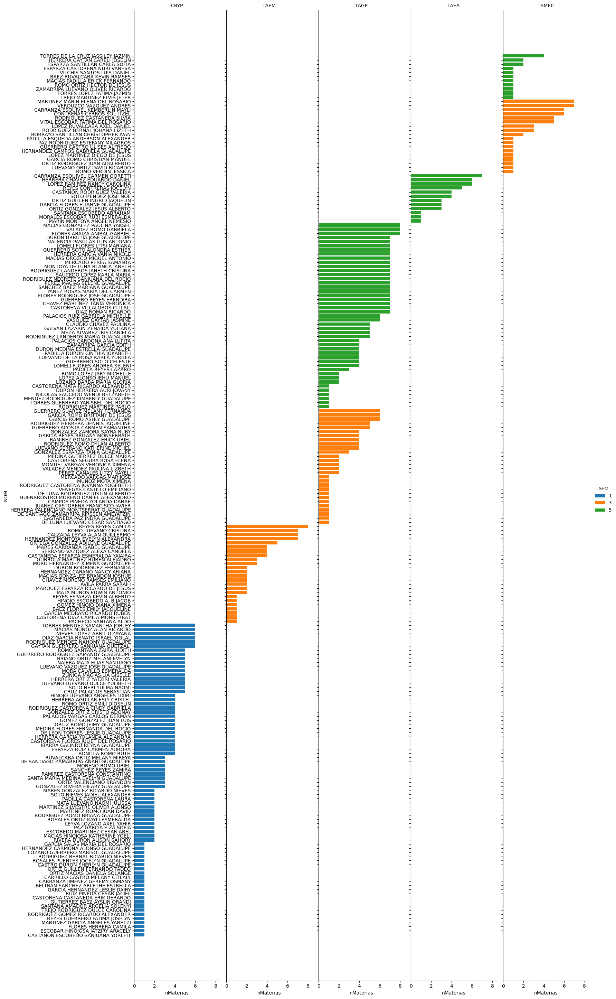

In [131]:


print('Número de materias con calificación de 9 o 10 observadas por alumno.')

# ploteo por alumno
arep1 = cbx.loc[(cbx['CALIF']>8) & (cbx['PERIODO'] == 'SEMESTRAL 1 - 2025')]
arep1 = arep1.groupby(['CARR','GPO','SEM','PAT','MAT','NOM'])['NCONT'].count()
arep1 = arep1.reset_index()
arep1=arep1.rename(columns={'NCONT':'nCasos'})
arep1=arep1.sort_values(['nCasos'],ascending=True)

apair = list()
for i,j,k in zip(arep1['PAT'],arep1['MAT'], arep1['NOM']):
    salida = i + ' ' + str(j) + ' ' + k
    apair.append(salida)
arep1['NOMINE']=apair


arep1['NOMINE'] = arep1['NOMINE'].apply(str)

graph2 = sns.FacetGrid(arep1, col ='CARR', hue='SEM',height=29,aspect=0.12)

# map the above form facetgrid with some attributes
graph2.map(plt.barh, 'NOMINE', 'nCasos')

graph2.set_titles(row_template = '{row_name}', col_template = '{col_name}')
graph2.set_axis_labels("nMaterias", "NOM")
graph2.add_legend()
#plt.subplots(figsize=(26, 22))

#plt.ylim(0,80)
plt.show()



In [132]:
import os

file_path = 'index.html'

In [133]:
# 3. Read the existing HTML template from 'index.html'
with open('index1.html', 'r',encoding='utf-8') as file:
    html_content = file.read()

# 4. Replace placeholders with values from the first row
html_content = html_content.replace("{{matricula}}", str(matricula))
html_content = html_content.replace("{{carreras}}", str(tot_carreras))
html_content = html_content.replace("{{tot_asig}}", str(tot_asig))
html_content = html_content.replace("{{docentes}}", str(docentes))
html_content = html_content.replace("{{mean}}", str(mean))
html_content = html_content.replace("{{sigma}}", str(sd))

html_content = html_content.replace("{{reprobados}}", str(cont_reprobados))
html_content = html_content.replace("{{reprobacion}}", str(repro_perc))

html_content = html_content.replace("{{en_riesgo}}", str(en_riesgo))
html_content = html_content.replace("{{riesgo_perc}}", str(riesgo_perc))
html_content = html_content.replace("{{todas}}", str(todas))

html_content = html_content.replace("{{destacados}}", str(tot_destacados))
html_content = html_content.replace("{{destacados_perc}}", str(destacados_perc))

mat_por_gpo_html = mat_por_gpo.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{tab_mat_sem}}", mat_por_gpo_html)

#for plotly
g1.write_html("g.html")  # Save the Plotly figure as an HTML file
fig2.write_html("fig2.html")  # Save the Plotly figure as an HTML file
fig3.write_html("fig3.html")  # Save the Plotly figure as an HTML file

# Export the plot to an HTML file from matplotlib
"""
import mpld3
g_html = mpld3.fig_to_html(g)
with open("plot.html", "w") as f:
    f.write(g_html)
"""

html_content = html_content.replace("<iframe id=fig1 src=\"g.html\" width=\"95%\" height=\"400\"></iframe>", 
                                    f'<iframe id=fig1 src="g.html" width="95%" height="400" style="border:none;"></iframe>')
html_content = html_content.replace("<iframe id=fig2 src=\"fig2.html\" width=\"300\" height=\"400\"></iframe>", 
                                    f'<iframe id=fig2 src="fig2.html" width="300" height="400" style="border:none;"></iframe>')
html_content = html_content.replace("<iframe id=fig3 src=\"fig3.html\" width=\"300\" height=\"400\"></iframe>", 
                                    f'<iframe id=fig3 src="fig3.html" width="300" height="400" style="border:none;"></iframe>')

import plotly.graph_objects as go
import plotly.io as pio
import plotly.express as px

meanstd_html = meanstd.to_html(classes='table table-bordered table-hover', index=True)
html_content = html_content.replace("{{tab_promedio}}", meanstd_html)

promInd_html = promedio_general.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{tab_promedio_ind}}", promInd_html)

repCarr_html = tabla_reprobados.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{tab_rep_car_perc}}", repCarr_html)

matrix_html = matriz.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{matriz}}", matrix_html)

riesgo_html = alumnos_en_riesgo.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{alto_riesgo}}", riesgo_html)

rep_asig_html = rep_asig.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{rep_asig}}", rep_asig_html)

asig_most_frec_final_html = asig_most_frec_final.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{asig_most_frec_final}}", asig_most_frec_final_html)

destac_html = tab_destacados.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{al_destacados}}", destac_html)

by_group_asigs_rep_html = by_group_asigs_rep.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{by_group_asigs_rep}}", by_group_asigs_rep_html)

glos_html = glosario.to_html(classes='table table-bordered table-hover', index=False)
html_content = html_content.replace("{{glosario}}", glos_html)



# 9. Save the final updated HTML file
with open('index.html', 'w', encoding='utf-8') as sitio:
    sitio.write(html_content)

# 10. Display the final HTML content in Jupyter
#display(HTML(html_content))

print("HTML file has been updated and saved as 'index_final.html'.")

'\nimport mpld3\ng_html = mpld3.fig_to_html(g)\nwith open("plot.html", "w") as f:\n    f.write(g_html)\n'

125828

HTML file has been updated and saved as 'index_final.html'.
